## Advance Lane Detection

# The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline


# Camera Calibration

In [4]:
import glob
import pickle
import os.path

# load calibration
mtx = None
dist = None
setting_path = "./camera_cal/wide_dist_pickle.p"
if os.path.exists(setting_path): 
    # Read in the saved calibration settings
    dist_pickle = pickle.load(open(setting_path, "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    print("Calibration settings loaded")
else: 
    path = "./camera_cal/*.jpg"
    images = glob.glob(path)
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    img_size = None


    for i in images:
        img = cv2.imread(i)
        if not img_size:
            img_size = (img.shape[1], img.shape[0])
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            write_name = './output_images/corners_found_' + os.path.split(i)[-1]
            cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
    cv2.destroyAllWindows()

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump(dist_pickle, open(setting_path, "wb"))
    print("Calibration settings calculated and saved")


Calibration settings loaded


# Camera Calibration Vizualization

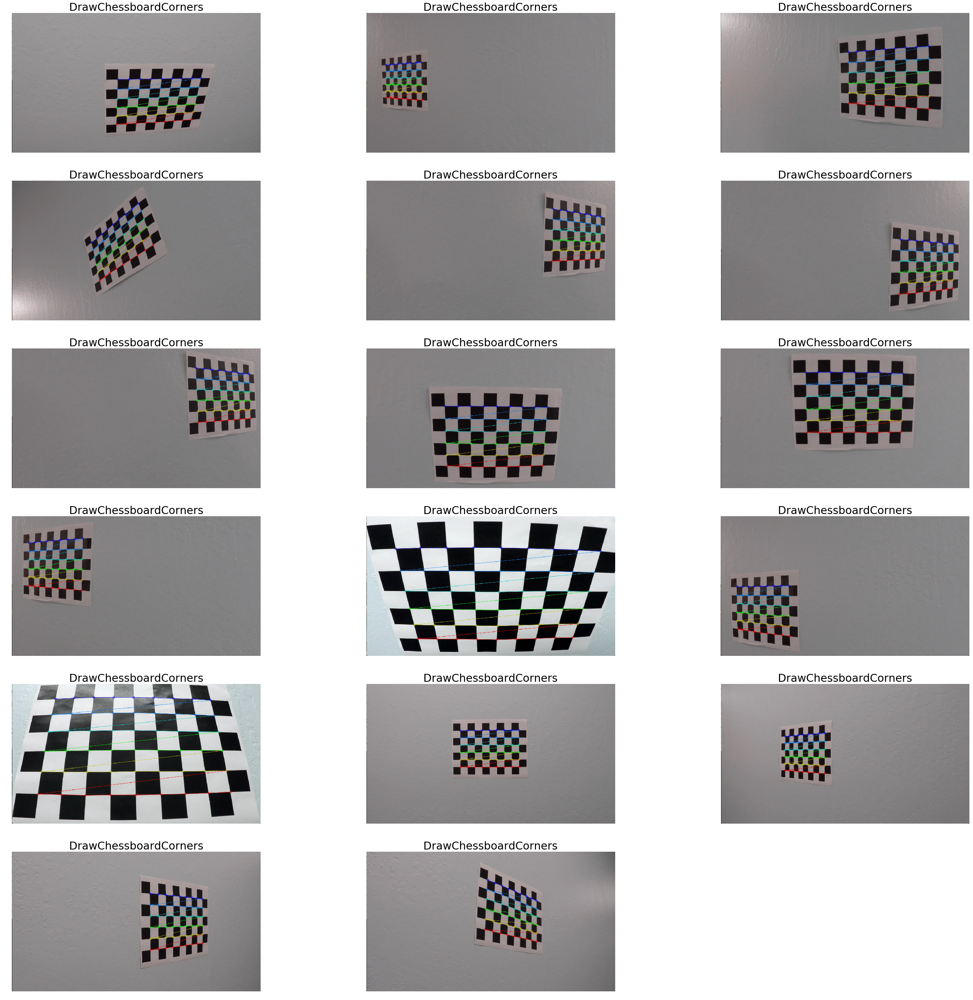

In [5]:
import math
fig = plt.figure()
fig.set_size_inches(50,50)
path = "./output_images/corners_found_*.jpg"
images = glob.glob(path)
total_image_count = len(images)
image_count = 1
for i in images:
    img = cv2.imread(i)
    ax = fig.add_subplot(math.ceil(total_image_count / 3), 3, image_count)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('DrawChessboardCorners', fontsize=30)
    image_count += 1


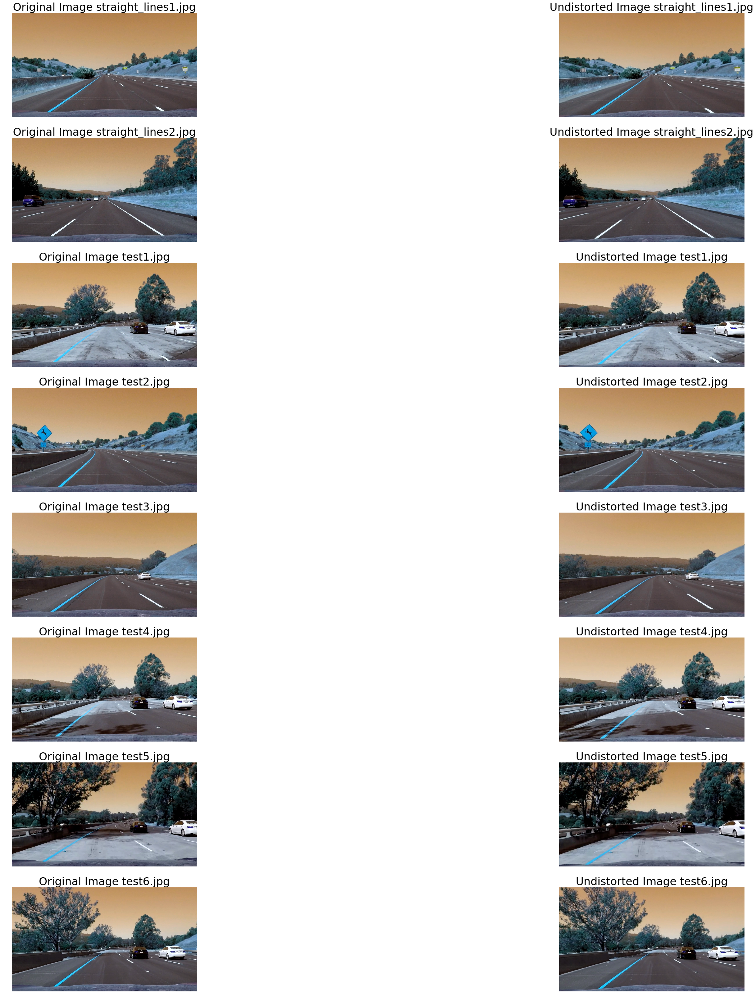

In [6]:
fig = plt.figure()
fig.set_size_inches(50,50)
path = "./test_images/*.jpg"
images = glob.glob(path)
total_image_count = len(images)
image_count = 1
for i in images:
    img = cv2.imread(i)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('./output_images/undistorted_' + os.path.split(i)[-1], dst)

    ax = fig.add_subplot(total_image_count, 2, image_count)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title('Original Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    ax = fig.add_subplot(math.ceil(total_image_count), 2, image_count)
    ax.imshow(dst)
    ax.axis('off')
    ax.set_title('Undistorted Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    

# Thresholding

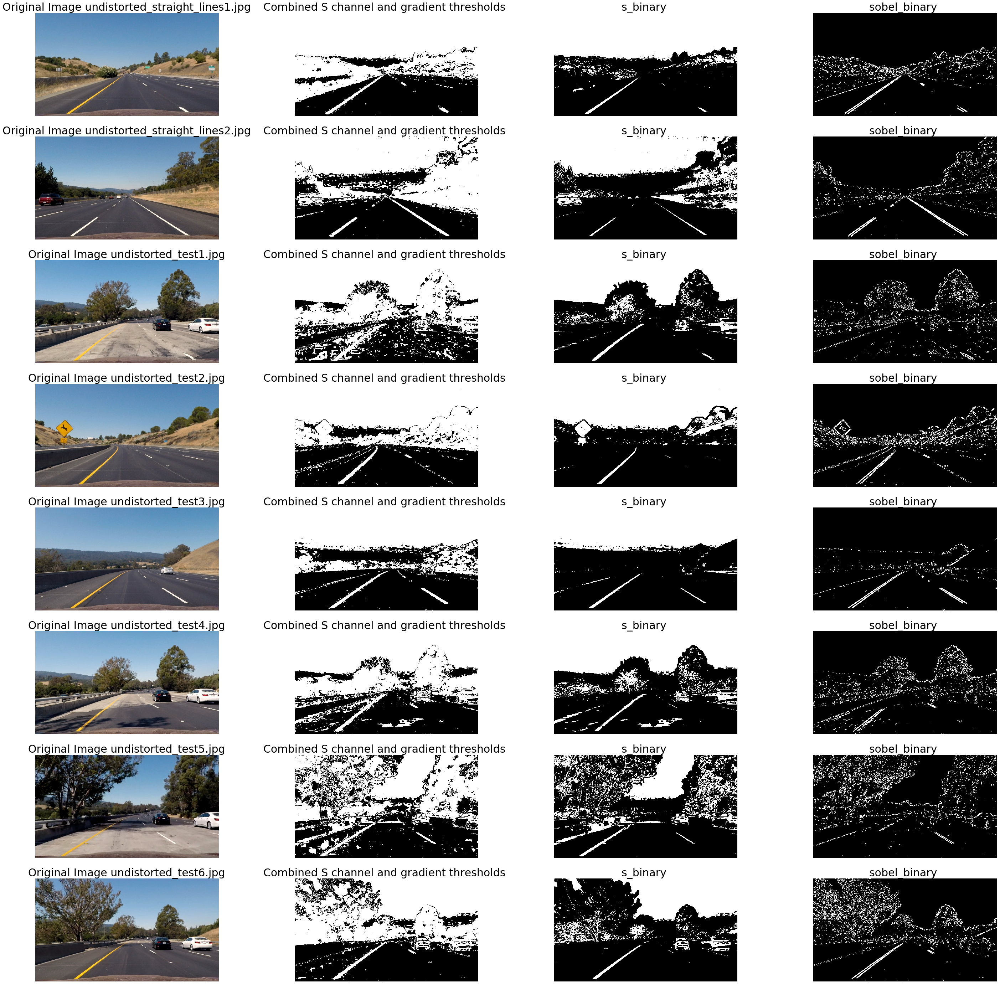

In [7]:
import glob
import os.path
import thresholding as th

path = "./output_images/undistorted_*.jpg"
images = glob.glob(path)

fig = plt.figure()
fig.set_size_inches(50,50)

total_image_count = len(images)
image_count = 1

for i in images:
    image = mpimg.imread(i) 

    combined_binary, s_binary, sobel_binary = th.combined_threshold(image)
    cv2.imwrite('./output_images/threshold_' + os.path.split(i)[-1], combined_binary)

    # Plotting thresholded images
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(image)
    ax.axis('off')
    ax.set_title('Original Image ' + os.path.split(i)[-1], fontsize=30)
    image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(combined_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('Combined S channel and gradient thresholds ', fontsize=30)
    image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(s_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('s_binary ', fontsize=30)
    image_count += 1
    ax = fig.add_subplot(total_image_count, 4, image_count)
    ax.imshow(sobel_binary, cmap='gray')
    ax.axis('off')
    ax.set_title('sobel_binary ', fontsize=30)
    image_count += 1

  

# Perspective transform

True

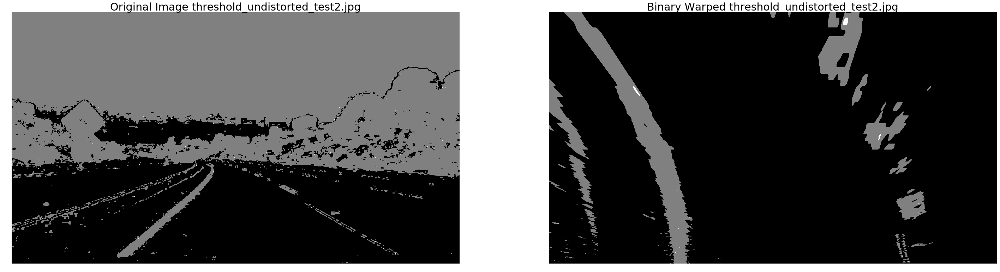

In [10]:
import glob
import os.path
from cv2 import IMREAD_GRAYSCALE
path = "./output_images/threshold_undistorted_test2.jpg"
images = glob.glob(path)

image = mpimg.imread(images[0]) 
img_size = (image.shape[1], image.shape[0])

fig = plt.figure()
fig.set_size_inches(50,50)

image_count = 1
offset = 200

src = np.float32([
    [  588,   446 ],
    [  691,   446 ],
    [ 1126,   673 ],
    [  153 ,   673 ]])
dst = np.float32([[offset, 0], [img_size[0] - offset, 0], [img_size[0] - offset, img_size[1]], [offset, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

binary_warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)

# Plotting thresholded images
ax = fig.add_subplot(1, 2, image_count)
ax.imshow(image, cmap='gray')
ax.axis('off')
ax.set_title('Original Image ' + os.path.split(images[0])[-1], fontsize=30)
image_count += 1
ax = fig.add_subplot(1, 2, image_count)
ax.imshow(binary_warped, cmap='gray')
ax.axis('off')
ax.set_title('Binary Warped ' + os.path.split(images[0])[-1], fontsize=30)
image_count += 1

cv2.imwrite('./output_images/Warped_' + os.path.split(images[0])[-1], binary_warped)



# Lane Detections

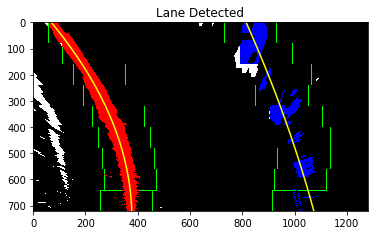

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def detect_lanes_full(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Number of sliding windows
    nwindows = 9

    # Height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identifing the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])


    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Margin in which to search
    margin = 100

    # Minimum number of pixels found to recenter window
    minpix = 50

    # Empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Steping through windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Drawing the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        # Identifing the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Appending these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # Recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenating the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    # left_fit, right_fit are the coefficients of polynomial 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return out_img, left_fit, right_fit
    ## Visualization
    
out_img, left_fit, right_fit = detect_lanes_full(binary_warped)
# ploty is just the coordinates for y axis: 0 - 719
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.title('Lane Detected')


# Radius of Curvature

In [26]:
def get_radius(left_fitx, right_fitx, ploty):

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return left_curverad, right_curverad


# left_curverad, right_curverad = get_radius(left_fitx, right_fitx, ploty)
left_curverad, right_curverad = get_radius(left_fitx, right_fitx, ploty)

# Now our radius of curvature is in meters
# print("left lane radius:" + left_curverad + 'm ' + "right lane radius:" + right_curverad + 'm ' + "Lane length: " + (right_curverad - left_curverad))
print(left_curverad, 'm', right_curverad, 'm')
print("left lane radius:" , left_curverad , 'm ' , "right lane radius:" , right_curverad , 'm ' , "Lane length: " , (right_curverad - left_curverad))


298.665961565 m 1353.91767012 m
left lane radius: 298.665961565 m  right lane radius: 1353.91767012 m  Lane length:  1055.25170855


# Plot the detected lane boundaries back onto the original image.

True

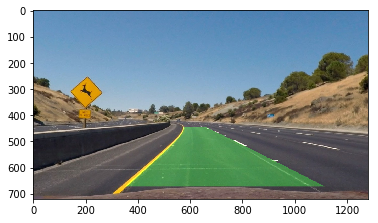

In [27]:
# Create an image to draw the lines on
path = "./output_images/undistorted_test2.jpg"
images = glob.glob(path)

undistorted = mpimg.imread(images[0]) 

def plot_lanes(undistorted, binary_warped, left_fitx, right_fitx, ploty):
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return result

result = plot_lanes(undistorted, binary_warped, left_fitx, right_fitx, ploty)
plt.imshow(result)
cv2.imwrite('./output_images/Final_test2.jpg', result)


# Generate Video

In [164]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

ploty = np.linspace(0, undistorted.shape[0]-1, undistorted.shape[0] )

def detect_lanes_incremental(binary_warped, left_fit, right_fit):
    # Margin in which to search
    margin = 100

    # Identifing the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
#     print("left_fit: " + str(left_fit))
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    
    # Extracting left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Minimum number of pixels found per lane to consider valid
    minpix = 2000
    valid = True
    if ((len(leftx) < minpix) or (len(rightx) < minpix)):
        print('Min pixels for lanes not found in incremental ', len(leftx), len(rightx))
        valid = False

    # Fit a second order polynomial to each
    new_left_fit = np.polyfit(lefty, leftx, 2)
    new_right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return out_img, new_left_fit, new_right_fit, valid

# Define a class to receive the characteristics of each line detection
class Line():
    MAX_INVALID = 5
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        self.num_invalid = self.MAX_INVALID
        
        # previous fit
        self.left_fit = []
        self.right_fit = []
        
        # x values of the last 3 fits of the line
        self.recent_xfitted_left = [] 
        self.recent_xfitted_right = [] 
        
    def update_fit(self, left_fit, right_fit):
        self.left_fit = left_fit
        self.right_fit = right_fit
#         self.recent_fits.append([left_fit, right_fit])
#         if len(self.recent_fits) > 3:
#             self.recent_fits.pop(0)
        
    def update_points(self, left_fitx, right_fitx):
        self.recent_xfitted_left.append(left_fitx.copy())
        self.recent_xfitted_right.append(right_fitx.copy())
        
        if len(self.recent_xfitted_left) > 3:
            self.recent_xfitted_left.pop(0)
            self.recent_xfitted_right.pop(0)
        
    def get_points(self):
        return self.recent_xfitted_left[-1], self.recent_xfitted_right[-1]

    def get_points_avg(self):        
        best_fit_left = np.average(self.recent_xfitted_left, axis=0)
        best_fit_right = np.average(self.recent_xfitted_right, axis=0)
        return best_fit_left, best_fit_right

    def reset(self):
        self.__init__()
        
def are_lines_valid(mid_point, left_fitx, right_fitx):
    valid = True
    if valid:
        left_line_base_pos = (left_fitx[-1] - mid_point)*3.7/700.0 # 3.7 meters is about 700 pixels in the x direction
        right_line_base_pos = (right_fitx[-1] - mid_point)*3.7/700.0 # 3.7 meters is about 700 pixels in the x direction
        maxdist = 5  # distance in meters for the lane
        mindist = 2
        if((abs(left_line_base_pos) > maxdist/2) or (abs(right_line_base_pos) > maxdist/2)):
            print('base lane too far away ', abs(left_line_base_pos), abs(right_line_base_pos))
            valid = False
        if((abs(left_line_base_pos) < mindist/2) or (abs(right_line_base_pos) < mindist/2)):
            print('base lane too close to center ', abs(left_line_base_pos), abs(right_line_base_pos))
            valid = False
    if valid:
        if (right_fitx - left_fitx).any() < 0:
            print('line cross ', abs(left_line_base_pos), abs(right_line_base_pos))
            valid = False
#         if valid:
#             left_line_avg_pos = (np.average(left_fitx) - mid_point)*3.7/700.0 # 3.7 meters is about 700 pixels in the x direction
#             right_line_avg_pos = (np.average(right_fitx) - mid_point)*3.7/700.0 # 3.7 meters is about 700 pixels in the x direction
#             maxdist = 5  # distance in meters for the lane
#             if((abs(left_line_avg_pos) > maxdist/2) or (abs(right_line_avg_pos) > maxdist/2)):
#                 print('avg lane too far away ', abs(left_line_avg_pos), abs(right_line_avg_pos))
#                 valid = False          return True
    return valid

def process_image(img):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    combined_binary, s_binary, sobel_binary = combined_threshold(undistorted)
    img_size = (undistorted.shape[1], undistorted.shape[0])

    binary_warped = cv2.warpPerspective(combined_binary, M, img_size, flags=cv2.INTER_LINEAR)

    left_fit = []
    right_fit = []
    valid = True
#     curr_img = None
    incremental = False
    
    if line.num_invalid < line.MAX_INVALID:
        incremental = True
        _, left_fit, right_fit, valid = detect_lanes_incremental(binary_warped, line.left_fit, line.right_fit)
    else:
        line.reset()
        _, left_fit, right_fit = detect_lanes_full(binary_warped)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    left_curverad, right_curverad = get_radius(left_fitx, right_fitx, ploty)
    lane_length = right_curverad - left_curverad
#     if valid:
#         if ((right_curverad/left_curverad) > 5) or ((right_curverad/left_curverad) < 0.2):
#             print("Lane curves too off: ", right_curverad/left_curverad)
#             valid = False
    
    mid_point = img_size[0]/2
    valid = are_lines_valid(mid_point, left_fitx, right_fitx)
    
    if ((not valid) and incremental):
        _, left_fit, right_fit = detect_lanes_full(binary_warped)
        incremental = False
        valid = True
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        left_curverad, right_curverad = get_radius(left_fitx, right_fitx, ploty)
        lane_length = right_curverad - left_curverad
#         if valid:
#             if ((right_curverad/left_curverad) > 5) or ((right_curverad/left_curverad) < 0.2):
#                 print("Lane curves too off: ", right_curverad/left_curverad)
#                 valid = False

        mid_point = img_size[0]/2
        valid = are_lines_valid(mid_point, left_fitx, right_fitx)
        if valid:
            print("Success !!!!!!!!!!")

    
#     valid = are_lines_valid(lane_length)
    line.detected = valid
    if valid:
        line.num_invalid = 0
        line.update_fit(left_fit, right_fit)
        line.update_points(left_fitx, right_fitx)
    else:
        line.num_invalid += 1
        l = len(line.recent_xfitted_left) 
        if l > 0:
            left_fit = line.left_fit
            right_fit = line.right_fit
            left_fitx, right_fitx = line.get_points()
            line.update_fit(left_fit, right_fit)
            line.update_points(left_fitx, right_fitx)

    if not (valid and incremental and (line.num_invalid == 0)):
        print("Valid: ", valid, " Incremental: ", incremental, line.num_invalid, len(line.recent_xfitted_left), len(line.recent_xfitted_right))

    l = len(line.recent_xfitted_left) 
    if l > 0:
        left_fitx, right_fitx = line.get_points_avg()
#         left_fitx, right_fitx = line.get_points()
        result = plot_lanes(undistorted, binary_warped, left_fitx, right_fitx, ploty)
    else:
        result = undistorted

    return result
        

In [165]:
line = Line()
output = 'project_video_marked.mp4'
clip1 = VideoFileClip("project_video.mp4")
# clip = VideoFileClip("project_video.mp4")
# clip1 = clip.subclip(35,45)
output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

Valid:  True  Incremental:  False 0 1 1
[MoviePy] >>>> Building video project_video_marked.mp4
[MoviePy] Writing video project_video_marked.mp4






















  0%|          | 0/1261 [00:00<?, ?it/s]



















  0%|          | 1/1261 [00:00<05:45,  3.65it/s]



















  0%|          | 2/1261 [00:00<05:41,  3.69it/s]



















  0%|          | 3/1261 [00:00<05:40,  3.69it/s]



















  0%|          | 4/1261 [00:01<05:33,  3.77it/s]



















  0%|          | 5/1261 [00:01<05:29,  3.81it/s]



















  0%|          | 6/1261 [00:01<05:32,  3.78it/s]



















  1%|          | 7/1261 [00:01<05:28,  3.82it/s]



















  1%|          | 8/1261 [00:02<05:24,  3.87it/s]



















  1%|          | 9/1261 [00:02<05:19,  3.92it/s]



















  1%|          | 10/1261 [00:02<05:14,  3.97it/s]



















  1%|          | 11/1261 [00:02<05:16,  3.94it/s]



















  1%|          | 12/1261 [00:03<05:15,  3.96it/s]



















  1%|          | 13/1261 [00:03<05:12,  4.00it/s]



















  1%|          | 14/1261 [00:03<

base lane too far away  1.52160869417 2.5002693411
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 77%|███████▋  | 977/1261 [04:08<01:17,  3.66it/s]



















 78%|███████▊  | 978/1261 [04:09<01:16,  3.70it/s]



















 78%|███████▊  | 979/1261 [04:09<01:15,  3.73it/s]



















 78%|███████▊  | 980/1261 [04:09<01:14,  3.75it/s]



















 78%|███████▊  | 981/1261 [04:09<01:13,  3.79it/s]



















 78%|███████▊  | 982/1261 [04:10<01:14,  3.76it/s]



















 78%|███████▊  | 983/1261 [04:10<01:13,  3.76it/s]



















 78%|███████▊  | 984/1261 [04:10<01:14,  3.73it/s]



















 78%|███████▊  | 985/1261 [04:10<01:14,  3.71it/s]



















 78%|███████▊  | 986/1261 [04:11<01:14,  3.69it/s]



















 78%|███████▊  | 987/1261 [04:11<01:13,  3.71it/s]



















 78%|███████▊  | 988/1261 [04:11<01:13,  3.72it/s]



















 78%|███████▊  | 989/1261 [04:12<01:12,  3.73it/s]



















 79%|███████▊  | 990/1261 [04:12<01:12,  3.74it/s]





















base lane too close to center  1.63580043672 0.891947901808
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 79%|███████▊  | 993/1261 [04:13<01:22,  3.24it/s]



















 79%|███████▉  | 994/1261 [04:13<01:20,  3.32it/s]



















 79%|███████▉  | 995/1261 [04:13<01:18,  3.37it/s]



















 79%|███████▉  | 996/1261 [04:14<01:20,  3.31it/s]



















 79%|███████▉  | 997/1261 [04:14<01:18,  3.34it/s]



















 79%|███████▉  | 998/1261 [04:14<01:20,  3.25it/s]



















 79%|███████▉  | 999/1261 [04:15<01:18,  3.34it/s]



















 79%|███████▉  | 1000/1261 [04:15<01:17,  3.38it/s]



















 79%|███████▉  | 1001/1261 [04:15<01:17,  3.37it/s]



















 79%|███████▉  | 1002/1261 [04:16<01:23,  3.10it/s]

base lane too far away  1.79308305036 2.62073072637
base lane too close to center  1.84085968606 0.496568636249
Valid:  False  Incremental:  False 1 3 3






















 80%|███████▉  | 1003/1261 [04:16<01:26,  2.99it/s]

base lane too far away  1.77533718462 2.51695609202
base lane too close to center  1.85899107753 0.000731756963323
Valid:  False  Incremental:  False 2 3 3






















 80%|███████▉  | 1004/1261 [04:16<01:24,  3.06it/s]



















 80%|███████▉  | 1005/1261 [04:16<01:20,  3.19it/s]



















 80%|███████▉  | 1006/1261 [04:17<01:16,  3.35it/s]



















 80%|███████▉  | 1007/1261 [04:17<01:11,  3.55it/s]



















 80%|███████▉  | 1008/1261 [04:17<01:09,  3.65it/s]



















 80%|████████  | 1009/1261 [04:18<01:07,  3.74it/s]



















 80%|████████  | 1010/1261 [04:18<01:06,  3.76it/s]



















 80%|████████  | 1011/1261 [04:18<01:06,  3.76it/s]



















 80%|████████  | 1012/1261 [04:18<01:04,  3.85it/s]



















 80%|████████  | 1013/1261 [04:19<01:04,  3.87it/s]



















 80%|████████  | 1014/1261 [04:19<01:04,  3.85it/s]



















 80%|████████  | 1015/1261 [04:19<01:04,  3.81it/s]



















 81%|████████  | 1016/1261 [04:19<01:07,  3.65it/s]



















 81%|████████  | 1017/1261 [04:20<01:13,  3.34it/s]







base lane too far away  1.81419196583 2.54944879775
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 82%|████████▏ | 1029/1261 [04:23<01:03,  3.63it/s]



















 82%|████████▏ | 1030/1261 [04:23<01:07,  3.44it/s]

base lane too far away  1.92436002828 2.53849157794
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 82%|████████▏ | 1031/1261 [04:24<01:06,  3.47it/s]



















 82%|████████▏ | 1032/1261 [04:24<01:03,  3.60it/s]



















 82%|████████▏ | 1033/1261 [04:24<01:04,  3.53it/s]



















 82%|████████▏ | 1034/1261 [04:24<01:06,  3.40it/s]



















 82%|████████▏ | 1035/1261 [04:25<01:07,  3.35it/s]



















 82%|████████▏ | 1036/1261 [04:25<01:07,  3.33it/s]



















 82%|████████▏ | 1037/1261 [04:25<01:04,  3.47it/s]



















 82%|████████▏ | 1038/1261 [04:26<01:07,  3.29it/s]



















 82%|████████▏ | 1039/1261 [04:26<01:06,  3.32it/s]



















 82%|████████▏ | 1040/1261 [04:26<01:09,  3.18it/s]



















 83%|████████▎ | 1041/1261 [04:27<01:14,  2.94it/s]



















 83%|████████▎ | 1042/1261 [04:27<01:10,  3.10it/s]



















 83%|████████▎ | 1043/1261 [04:27<01:05,  3.31it/s]



















 83%|████████▎ | 1044/1261 [04:28<01:02,  3.46it/s]







base lane too far away  1.31125135325 2.51092882225
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















100%|█████████▉| 1256/1261 [05:21<00:01,  3.56it/s]



















100%|█████████▉| 1257/1261 [05:21<00:01,  3.64it/s]



















100%|█████████▉| 1258/1261 [05:21<00:00,  3.78it/s]



















100%|█████████▉| 1259/1261 [05:21<00:00,  3.82it/s]



















100%|█████████▉| 1260/1261 [05:22<00:00,  3.77it/s]





















[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_marked.mp4 

CPU times: user 5min 46s, sys: 1min 13s, total: 6min 59s
Wall time: 5min 22s


In [161]:
output = 'challenge_video_marked.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

Valid:  True  Incremental:  False 0 1 1
[MoviePy] >>>> Building video challenge_video_marked.mp4
[MoviePy] Writing video challenge_video_marked.mp4






















  0%|          | 0/485 [00:00<?, ?it/s]



















  0%|          | 1/485 [00:00<02:04,  3.89it/s]



















  0%|          | 2/485 [00:00<02:04,  3.88it/s]



















  1%|          | 3/485 [00:00<02:03,  3.91it/s]



















  1%|          | 4/485 [00:01<02:02,  3.94it/s]



















  1%|          | 5/485 [00:01<02:00,  3.98it/s]



















  1%|          | 6/485 [00:01<01:59,  4.02it/s]



















  1%|▏         | 7/485 [00:01<02:00,  3.97it/s]



















  2%|▏         | 8/485 [00:02<02:00,  3.96it/s]



















  2%|▏         | 9/485 [00:02<01:59,  3.98it/s]



















  2%|▏         | 10/485 [00:02<01:57,  4.03it/s]



















  2%|▏         | 11/485 [00:02<01:58,  4.01it/s]



















  2%|▏         | 12/485 [00:02<01:56,  4.05it/s]



















  3%|▎         | 13/485 [00:03<01:55,  4.08it/s]



















  3%|▎         | 14/485 [00:03<01:56,  4.05it/

base lane too far away  1.53345004863 2.50428162039
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















  8%|▊         | 37/485 [00:09<02:11,  3.42it/s]



















  8%|▊         | 38/485 [00:09<02:11,  3.39it/s]



















  8%|▊         | 39/485 [00:10<02:10,  3.41it/s]



















  8%|▊         | 40/485 [00:10<02:13,  3.33it/s]



















  8%|▊         | 41/485 [00:10<02:13,  3.34it/s]



















  9%|▊         | 42/485 [00:10<02:15,  3.28it/s]



















  9%|▉         | 43/485 [00:11<02:16,  3.23it/s]



















  9%|▉         | 44/485 [00:11<02:16,  3.22it/s]



















  9%|▉         | 45/485 [00:11<02:14,  3.27it/s]



















  9%|▉         | 46/485 [00:12<02:19,  3.15it/s]



















 10%|▉         | 47/485 [00:12<02:24,  3.02it/s]



















 10%|▉         | 48/485 [00:12<02:27,  2.97it/s]



















 10%|█         | 49/485 [00:13<02:24,  3.02it/s]



















 10%|█         | 50/485 [00:13<02:24,  3.02it/s]



















 11%|█         | 51/485 [00:

base lane too far away  1.66316572955 2.52287928287
base lane too far away  0.448207792695 2.51174389097
base lane too close to center  0.448207792695 2.51174389097
Valid:  False  Incremental:  False 1 3 3






















 11%|█         | 53/485 [00:14<02:27,  2.93it/s]



















 11%|█         | 54/485 [00:15<02:30,  2.87it/s]

base lane too far away  1.68565820727 2.527186131
base lane too far away  0.521240784595 2.5420075693
base lane too close to center  0.521240784595 2.5420075693
Valid:  False  Incremental:  False 1 3 3






















 11%|█▏        | 55/485 [00:15<02:33,  2.80it/s]

base lane too far away  1.76835272144 2.50075122973
base lane too close to center  0.018368199164 0.0417190821576
Valid:  False  Incremental:  False 2 3 3






















 12%|█▏        | 56/485 [00:15<02:40,  2.67it/s]

base lane too far away  1.81142607458 2.57323416565
base lane too close to center  0.243719559622 0.0684122678337
Valid:  False  Incremental:  False 3 3 3






















 12%|█▏        | 57/485 [00:16<02:42,  2.64it/s]

base lane too far away  1.83023708557 2.54992645979
base lane too far away  0.326370448799 2.57115327502
base lane too close to center  0.326370448799 2.57115327502
Valid:  False  Incremental:  False 4 3 3






















 12%|█▏        | 58/485 [00:16<02:44,  2.60it/s]

base lane too far away  1.86150481145 2.62602949347
base lane too close to center  0.365357982845 0.209195020715
Valid:  False  Incremental:  False 5 3 3






















 12%|█▏        | 59/485 [00:16<02:35,  2.74it/s]

base lane too close to center  0.506559018872 0.399516217426
Valid:  False  Incremental:  False 6 0 0






















 12%|█▏        | 60/485 [00:17<02:28,  2.86it/s]

base lane too close to center  0.148205712109 0.232461309799
Valid:  False  Incremental:  False 6 0 0






















 13%|█▎        | 61/485 [00:17<02:20,  3.02it/s]

base lane too close to center  0.354709429615 0.410468414601
Valid:  False  Incremental:  False 6 0 0






















 13%|█▎        | 62/485 [00:17<02:21,  2.99it/s]

base lane too far away  0.318575965668 2.69679925726
base lane too close to center  0.318575965668 2.69679925726
Valid:  False  Incremental:  False 6 0 0






















 13%|█▎        | 63/485 [00:18<02:20,  3.01it/s]

base lane too far away  0.34948593914 2.61269360374
base lane too close to center  0.34948593914 2.61269360374
Valid:  False  Incremental:  False 6 0 0






















 13%|█▎        | 64/485 [00:18<02:13,  3.16it/s]

base lane too far away  0.357460012396 2.62887838429
base lane too close to center  0.357460012396 2.62887838429
Valid:  False  Incremental:  False 6 0 0






















 13%|█▎        | 65/485 [00:18<02:16,  3.07it/s]

base lane too far away  0.528164365355 2.73398034162
base lane too close to center  0.528164365355 2.73398034162
Valid:  False  Incremental:  False 6 0 0






















 14%|█▎        | 66/485 [00:19<02:19,  3.00it/s]

base lane too far away  0.547152955447 2.73451220724
base lane too close to center  0.547152955447 2.73451220724
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 67/485 [00:19<02:20,  2.97it/s]

base lane too far away  0.372105714098 2.78741922309
base lane too close to center  0.372105714098 2.78741922309
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 68/485 [00:19<02:16,  3.06it/s]

base lane too far away  1.09868561635 2.83006230851
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 69/485 [00:20<02:20,  2.95it/s]

base lane too far away  0.667715825215 2.68543915524
base lane too close to center  0.667715825215 2.68543915524
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 70/485 [00:20<02:24,  2.87it/s]

base lane too far away  0.306117213856 2.76607614021
base lane too close to center  0.306117213856 2.76607614021
Valid:  False  Incremental:  False 6 0 0






















 15%|█▍        | 71/485 [00:20<02:24,  2.86it/s]

base lane too far away  0.956349980514 2.83605756552
base lane too close to center  0.956349980514 2.83605756552
Valid:  False  Incremental:  False 6 0 0






















 15%|█▍        | 72/485 [00:21<02:24,  2.87it/s]

base lane too far away  0.956104267918 2.90691960556
base lane too close to center  0.956104267918 2.90691960556
Valid:  False  Incremental:  False 6 0 0






















 15%|█▌        | 73/485 [00:21<02:14,  3.05it/s]

base lane too far away  1.12970748465 2.90103141917
Valid:  False  Incremental:  False 6 0 0






















 15%|█▌        | 74/485 [00:21<02:19,  2.94it/s]

base lane too far away  0.645352550069 2.895662153
base lane too close to center  0.645352550069 2.895662153
Valid:  False  Incremental:  False 6 0 0






















 15%|█▌        | 75/485 [00:22<02:17,  2.98it/s]

base lane too close to center  0.49252685065 0.0827212338109
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 76/485 [00:22<02:09,  3.15it/s]

base lane too close to center  1.28823634404 0.440357866315
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 77/485 [00:22<02:06,  3.22it/s]

base lane too close to center  1.07661571826 0.00483084029727
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 78/485 [00:23<02:09,  3.13it/s]

base lane too close to center  0.943580500974 0.00460634754143
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 79/485 [00:23<02:09,  3.13it/s]

base lane too close to center  0.20277922858 0.56252668369
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 80/485 [00:23<02:10,  3.10it/s]

base lane too far away  1.24993124568 2.97141634936
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 81/485 [00:24<02:16,  2.97it/s]

base lane too far away  1.28358855114 3.0119232973
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 82/485 [00:24<02:15,  2.98it/s]

base lane too close to center  1.15303371318 0.647841386573
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 83/485 [00:24<02:14,  2.99it/s]

base lane too close to center  0.381914852972 0.616261417921
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 84/485 [00:25<02:15,  2.95it/s]

base lane too close to center  1.00494903692 0.567707710874
Valid:  False  Incremental:  False 6 0 0






















 18%|█▊        | 85/485 [00:25<02:10,  3.06it/s]

base lane too far away  0.368870682462 3.0036803156
base lane too close to center  0.368870682462 3.0036803156
Valid:  False  Incremental:  False 6 0 0






















 18%|█▊        | 86/485 [00:25<02:09,  3.08it/s]

base lane too far away  1.21558142896 2.98727008714
Valid:  False  Incremental:  False 6 0 0






















 18%|█▊        | 87/485 [00:26<02:14,  2.97it/s]

base lane too close to center  0.00166316451704 0.590107721379
Valid:  False  Incremental:  False 6 0 0






















 18%|█▊        | 88/485 [00:26<02:12,  3.01it/s]

base lane too close to center  0.50714148506 0.663595656736
Valid:  False  Incremental:  False 6 0 0






















 18%|█▊        | 89/485 [00:26<02:09,  3.06it/s]

base lane too close to center  0.267895522334 0.714983726125
Valid:  False  Incremental:  False 6 0 0






















 19%|█▊        | 90/485 [00:27<02:04,  3.17it/s]

base lane too close to center  0.124875638053 0.746291901343
Valid:  False  Incremental:  False 6 0 0






















 19%|█▉        | 91/485 [00:27<02:07,  3.09it/s]

base lane too close to center  0.10612158249 0.388738781279
Valid:  False  Incremental:  False 6 0 0






















 19%|█▉        | 92/485 [00:27<02:17,  2.86it/s]

base lane too close to center  1.17861503104 0.466068364109
Valid:  False  Incremental:  False 6 0 0






















 19%|█▉        | 93/485 [00:28<02:14,  2.92it/s]

base lane too close to center  0.00812762534402 0.364233786395
Valid:  False  Incremental:  False 6 0 0






















 19%|█▉        | 94/485 [00:28<02:05,  3.10it/s]

base lane too close to center  0.278873833825 0.416804087744
Valid:  False  Incremental:  False 6 0 0






















 20%|█▉        | 95/485 [00:28<02:08,  3.03it/s]

base lane too close to center  0.37720109539 0.37720109539
Valid:  False  Incremental:  False 6 0 0






















 20%|█▉        | 96/485 [00:29<02:19,  2.78it/s]

base lane too close to center  0.813443307045 0.56836661785
Valid:  False  Incremental:  False 6 0 0






















 20%|██        | 97/485 [00:29<02:13,  2.91it/s]

base lane too close to center  1.11038998602 0.389926908272
Valid:  False  Incremental:  False 6 0 0






















 20%|██        | 98/485 [00:29<02:10,  2.97it/s]

base lane too close to center  1.05227727066 0.455196089802
Valid:  False  Incremental:  False 6 0 0






















 20%|██        | 99/485 [00:30<02:01,  3.18it/s]

base lane too close to center  0.34445543182 0.467962545394
Valid:  False  Incremental:  False 6 0 0






















 21%|██        | 100/485 [00:30<02:03,  3.12it/s]

base lane too close to center  0.165863775754 0.190221714354
Valid:  False  Incremental:  False 6 0 0






















 21%|██        | 101/485 [00:30<02:14,  2.85it/s]

base lane too close to center  1.22073569662 0.286851306466
Valid:  False  Incremental:  False 6 0 0






















 21%|██        | 102/485 [00:31<02:09,  2.96it/s]

base lane too close to center  1.22417549293 0.0355267696468
Valid:  False  Incremental:  False 6 0 0






















 21%|██        | 103/485 [00:31<02:00,  3.18it/s]

base lane too close to center  1.22455203079 0.485910289774
Valid:  False  Incremental:  False 6 0 0






















 21%|██▏       | 104/485 [00:31<01:58,  3.20it/s]

Valid:  True  Incremental:  False 0 1 1






















 22%|██▏       | 105/485 [00:31<01:54,  3.32it/s]



















 22%|██▏       | 106/485 [00:32<01:48,  3.49it/s]



















 22%|██▏       | 107/485 [00:32<01:44,  3.61it/s]



















 22%|██▏       | 108/485 [00:32<01:42,  3.70it/s]



















 22%|██▏       | 109/485 [00:33<01:39,  3.78it/s]



















 23%|██▎       | 110/485 [00:33<01:36,  3.89it/s]



















 23%|██▎       | 111/485 [00:33<01:35,  3.93it/s]



















 23%|██▎       | 112/485 [00:33<01:33,  3.99it/s]



















 23%|██▎       | 113/485 [00:33<01:32,  4.03it/s]



















 24%|██▎       | 114/485 [00:34<01:31,  4.05it/s]



















 24%|██▎       | 115/485 [00:34<01:29,  4.13it/s]



















 24%|██▍       | 116/485 [00:34<01:29,  4.12it/s]



















 24%|██▍       | 117/485 [00:34<01:29,  4.09it/s]



















 24%|██▍       | 118/485 [00:35<01:29,  4.08it/s]



















 25%|██▍      

base lane too close to center  1.71099086394 0.957485170054
base lane too close to center  0.111787575213 0.0718123792244
Valid:  False  Incremental:  False 1 3 3






















 27%|██▋       | 133/485 [00:40<02:02,  2.87it/s]

base lane too close to center  1.73424539255 0.388750978843
base lane too far away  0.342797041393 2.88105362158
base lane too close to center  0.342797041393 2.88105362158
Valid:  False  Incremental:  False 2 3 3






















 28%|██▊       | 134/485 [00:40<02:12,  2.65it/s]

base lane too close to center  1.7207123425 0.243128409918
base lane too close to center  0.257459380079 2.36049690576
Valid:  False  Incremental:  False 3 3 3






















 28%|██▊       | 135/485 [00:40<02:04,  2.80it/s]

base lane too close to center  1.73976792529 0.192192129944
base lane too close to center  0.165833730769 2.04214111316
Valid:  False  Incremental:  False 4 3 3






















 28%|██▊       | 136/485 [00:41<01:58,  2.94it/s]

base lane too close to center  1.56086014736 0.0479788042833
base lane too close to center  0.124469168049 1.9464867275
Valid:  False  Incremental:  False 5 3 3






















 28%|██▊       | 137/485 [00:41<01:54,  3.03it/s]

base lane too close to center  0.20559942074 0.147626896728
Valid:  False  Incremental:  False 6 0 0






















 28%|██▊       | 138/485 [00:41<01:51,  3.10it/s]

base lane too close to center  0.244728779982 1.17091260248
Valid:  False  Incremental:  False 6 0 0






















 29%|██▊       | 139/485 [00:42<01:58,  2.91it/s]

base lane too close to center  0.533119417192 1.13126606086
Valid:  False  Incremental:  False 6 0 0






















 29%|██▉       | 140/485 [00:42<02:05,  2.76it/s]

base lane too close to center  0.529432127517 0.634927186505
Valid:  False  Incremental:  False 6 0 0






















 29%|██▉       | 141/485 [00:42<01:58,  2.90it/s]

Valid:  True  Incremental:  False 0 1 1






















 29%|██▉       | 142/485 [00:43<01:55,  2.96it/s]

base lane too close to center  1.35764942168 0.997199754463
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 2 2






















 29%|██▉       | 143/485 [00:43<02:05,  2.73it/s]

base lane too close to center  1.24476658311 0.710574557581
base lane too close to center  0.347569266196 1.00769741564
Valid:  False  Incremental:  False 1 3 3






















 30%|██▉       | 144/485 [00:44<02:12,  2.57it/s]

base lane too close to center  1.26427648167 0.621720516775
base lane too close to center  0.813707929133 0.959318303371
Valid:  False  Incremental:  False 2 3 3






















 30%|██▉       | 145/485 [00:44<02:04,  2.74it/s]

base lane too close to center  1.29913992124 0.603905117883
base lane too close to center  0.684552995132 0.893958915841
Valid:  False  Incremental:  False 3 3 3






















 30%|███       | 146/485 [00:44<02:10,  2.61it/s]

base lane too close to center  1.31825694481 0.480536048906
base lane too close to center  1.18197084179 0.888678672811
Valid:  False  Incremental:  False 4 3 3






















 30%|███       | 147/485 [00:45<02:03,  2.74it/s]

base lane too close to center  1.35138959911 0.329374050921
base lane too close to center  1.28566166923 0.744946464017
Valid:  False  Incremental:  False 5 3 3






















 31%|███       | 148/485 [00:45<01:54,  2.93it/s]

Valid:  True  Incremental:  False 0 1 1






















 31%|███       | 149/485 [00:45<01:51,  3.01it/s]

base lane too close to center  1.44829583071 0.892884807757
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 2 2






















 31%|███       | 150/485 [00:46<01:48,  3.08it/s]

base lane too close to center  1.36621083517 0.90636624978
base lane too close to center  1.12314141147 0.831022241834
Valid:  False  Incremental:  False 1 3 3






















 31%|███       | 151/485 [00:46<01:45,  3.16it/s]

base lane too close to center  1.39187877484 0.0943787437084
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 31%|███▏      | 152/485 [00:46<01:41,  3.29it/s]



















 32%|███▏      | 153/485 [00:46<01:37,  3.41it/s]



















 32%|███▏      | 154/485 [00:47<01:32,  3.58it/s]



















 32%|███▏      | 155/485 [00:47<01:29,  3.68it/s]



















 32%|███▏      | 156/485 [00:47<01:27,  3.77it/s]



















 32%|███▏      | 157/485 [00:47<01:26,  3.79it/s]



















 33%|███▎      | 158/485 [00:48<01:24,  3.86it/s]



















 33%|███▎      | 159/485 [00:48<01:25,  3.80it/s]

base lane too close to center  1.49090800518 0.98192974136
base lane too close to center  0.998603204559 0.63600688588
Valid:  False  Incremental:  False 1 3 3






















 33%|███▎      | 160/485 [00:48<01:28,  3.66it/s]

base lane too close to center  1.52981127488 0.88007010829
base lane too close to center  0.961400811117 1.75177081503
Valid:  False  Incremental:  False 2 3 3






















 33%|███▎      | 161/485 [00:48<01:30,  3.58it/s]

base lane too close to center  1.50787182828 0.737928598238
base lane too close to center  1.00447273151 0.634584913274
Valid:  False  Incremental:  False 3 3 3






















 33%|███▎      | 162/485 [00:49<01:31,  3.53it/s]

base lane too close to center  1.50391050188 0.196072341256
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 34%|███▎      | 163/485 [00:49<01:30,  3.57it/s]



















 34%|███▍      | 164/485 [00:49<01:26,  3.69it/s]



















 34%|███▍      | 165/485 [00:50<01:24,  3.79it/s]



















 34%|███▍      | 166/485 [00:50<01:22,  3.88it/s]



















 34%|███▍      | 167/485 [00:50<01:22,  3.86it/s]



















 35%|███▍      | 168/485 [00:50<01:21,  3.88it/s]



















 35%|███▍      | 169/485 [00:51<01:24,  3.73it/s]



















 35%|███▌      | 170/485 [00:51<01:22,  3.84it/s]



















 35%|███▌      | 171/485 [00:51<01:21,  3.85it/s]



















 35%|███▌      | 172/485 [00:51<01:20,  3.91it/s]



















 36%|███▌      | 173/485 [00:52<01:20,  3.87it/s]

base lane too far away  1.44361218177 3.63715236288
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 36%|███▌      | 174/485 [00:52<01:21,  3.82it/s]



















 36%|███▌      | 175/485 [00:52<01:20,  3.83it/s]



















 36%|███▋      | 176/485 [00:52<01:19,  3.91it/s]



















 36%|███▋      | 177/485 [00:53<01:17,  3.98it/s]



















 37%|███▋      | 178/485 [00:53<01:16,  4.02it/s]



















 37%|███▋      | 179/485 [00:53<01:16,  3.99it/s]



















 37%|███▋      | 180/485 [00:53<01:16,  3.98it/s]



















 37%|███▋      | 181/485 [00:54<01:27,  3.49it/s]



















 38%|███▊      | 182/485 [00:54<01:23,  3.64it/s]



















 38%|███▊      | 183/485 [00:54<01:23,  3.63it/s]



















 38%|███▊      | 184/485 [00:55<01:21,  3.71it/s]



















 38%|███▊      | 185/485 [00:55<01:18,  3.80it/s]



















 38%|███▊      | 186/485 [00:55<01:17,  3.86it/s]



















 39%|███▊      | 187/485 [00:55<01:19,  3.77it/s]

base lane too far away  1.61775131983 3.03592848525
base lane too close to center  1.2959559606 0.852912051403
Valid:  False  Incremental:  False 1 3 3






















 39%|███▉      | 188/485 [00:56<01:32,  3.21it/s]

base lane too far away  1.61466509392 2.96941615552
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 39%|███▉      | 189/485 [00:56<01:28,  3.36it/s]



















 39%|███▉      | 190/485 [00:56<01:24,  3.47it/s]



















 39%|███▉      | 191/485 [00:57<01:22,  3.57it/s]



















 40%|███▉      | 192/485 [00:57<01:18,  3.73it/s]



















 40%|███▉      | 193/485 [00:57<01:17,  3.77it/s]



















 40%|████      | 194/485 [00:57<01:15,  3.85it/s]



















 40%|████      | 195/485 [00:58<01:15,  3.83it/s]



















 40%|████      | 196/485 [00:58<01:14,  3.88it/s]



















 41%|████      | 197/485 [00:58<01:12,  3.99it/s]



















 41%|████      | 198/485 [00:58<01:11,  4.03it/s]



















 41%|████      | 199/485 [00:58<01:10,  4.06it/s]



















 41%|████      | 200/485 [00:59<01:10,  4.04it/s]



















 41%|████▏     | 201/485 [00:59<01:10,  4.01it/s]



















 42%|████▏     | 202/485 [00:59<01:10,  4.00it/s]



















 42%|████▏    

base lane too close to center  1.59354973417 0.721941401407
base lane too close to center  1.66822408776 0.203644620696
Valid:  False  Incremental:  False 1 3 3






















 43%|████▎     | 210/485 [01:01<01:10,  3.89it/s]



















 44%|████▎     | 211/485 [01:02<01:12,  3.78it/s]

base lane too close to center  1.5096171488 0.731860537371
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 44%|████▎     | 212/485 [01:02<01:12,  3.75it/s]



















 44%|████▍     | 213/485 [01:02<01:10,  3.87it/s]



















 44%|████▍     | 214/485 [01:02<01:09,  3.88it/s]



















 44%|████▍     | 215/485 [01:03<01:08,  3.97it/s]



















 45%|████▍     | 216/485 [01:03<01:06,  4.04it/s]



















 45%|████▍     | 217/485 [01:03<01:05,  4.10it/s]



















 45%|████▍     | 218/485 [01:03<01:05,  4.10it/s]



















 45%|████▌     | 219/485 [01:04<01:04,  4.14it/s]



















 45%|████▌     | 220/485 [01:04<01:03,  4.17it/s]



















 46%|████▌     | 221/485 [01:04<01:02,  4.22it/s]



















 46%|████▌     | 222/485 [01:04<01:01,  4.24it/s]



















 46%|████▌     | 223/485 [01:04<01:01,  4.26it/s]



















 46%|████▌     | 224/485 [01:05<01:01,  4.26it/s]



















 46%|████▋     | 225/485 [01:05<01:01,  4.21it/s]



















 47%|████▋    

base lane too close to center  1.85904879478 0.114401567317
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 50%|█████     | 244/485 [01:10<01:13,  3.27it/s]



















 51%|█████     | 245/485 [01:10<01:08,  3.51it/s]



















 51%|█████     | 246/485 [01:10<01:04,  3.69it/s]



















 51%|█████     | 247/485 [01:11<01:03,  3.78it/s]



















 51%|█████     | 248/485 [01:11<01:04,  3.68it/s]



















 51%|█████▏    | 249/485 [01:11<01:02,  3.76it/s]



















 52%|█████▏    | 250/485 [01:11<01:01,  3.83it/s]



















 52%|█████▏    | 251/485 [01:12<01:03,  3.69it/s]



















 52%|█████▏    | 252/485 [01:12<01:07,  3.45it/s]



















 52%|█████▏    | 253/485 [01:12<01:04,  3.60it/s]



















 52%|█████▏    | 254/485 [01:12<01:01,  3.73it/s]



















 53%|█████▎    | 255/485 [01:13<01:00,  3.82it/s]



















 53%|█████▎    | 256/485 [01:13<00:58,  3.95it/s]



















 53%|█████▎    | 257/485 [01:13<00:56,  4.03it/s]



















 53%|█████▎   

base lane too far away  1.88431930805 2.63202520085
base lane too close to center  0.961425166275 0.125220994468
Valid:  False  Incremental:  False 1 3 3






















 73%|███████▎  | 355/485 [01:43<00:41,  3.15it/s]

base lane too far away  1.88861818447 2.60804761058
base lane too close to center  1.10044427631 0.117285885052
Valid:  False  Incremental:  False 2 3 3






















 73%|███████▎  | 356/485 [01:43<00:39,  3.23it/s]



















 74%|███████▎  | 357/485 [01:43<00:39,  3.23it/s]



















 74%|███████▍  | 358/485 [01:44<00:38,  3.28it/s]



















 74%|███████▍  | 359/485 [01:44<00:36,  3.42it/s]



















 74%|███████▍  | 360/485 [01:44<00:35,  3.52it/s]



















 74%|███████▍  | 361/485 [01:45<00:35,  3.54it/s]



















 75%|███████▍  | 362/485 [01:45<00:34,  3.58it/s]



















 75%|███████▍  | 363/485 [01:45<00:33,  3.64it/s]



















 75%|███████▌  | 364/485 [01:45<00:33,  3.63it/s]



















 75%|███████▌  | 365/485 [01:46<00:32,  3.70it/s]



















 75%|███████▌  | 366/485 [01:46<00:32,  3.71it/s]



















 76%|███████▌  | 367/485 [01:46<00:31,  3.75it/s]



















 76%|███████▌  | 368/485 [01:46<00:31,  3.69it/s]



















 76%|███████▌  | 369/485 [01:47<00:32,  3.61it/s]



















 76%|███████▋ 

base lane too far away  1.7223156837 2.53103942833
base lane too close to center  1.26756285045 0.151027650285
Valid:  False  Incremental:  False 1 3 3






















 85%|████████▌ | 414/485 [02:02<00:23,  2.97it/s]



















 86%|████████▌ | 415/485 [02:02<00:23,  2.96it/s]

base lane too far away  1.61545832043 2.55262377256
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 86%|████████▌ | 416/485 [02:02<00:23,  2.92it/s]

base lane too close to center  0.988662339021 1.37040907114
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 86%|████████▌ | 417/485 [02:03<00:24,  2.80it/s]

base lane too close to center  0.971439343685 1.36309716335
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 86%|████████▌ | 418/485 [02:03<00:23,  2.91it/s]



















 86%|████████▋ | 419/485 [02:03<00:22,  2.97it/s]



















 87%|████████▋ | 420/485 [02:04<00:24,  2.62it/s]



















 87%|████████▋ | 421/485 [02:04<00:23,  2.71it/s]



















 87%|████████▋ | 422/485 [02:04<00:22,  2.74it/s]



















 87%|████████▋ | 423/485 [02:05<00:21,  2.84it/s]

base lane too close to center  0.988277641064 1.46969546065
base lane too close to center  0.990954062998 1.42955405234
Valid:  False  Incremental:  False 1 3 3






















 87%|████████▋ | 424/485 [02:05<00:21,  2.84it/s]

base lane too close to center  0.997351786449 1.56270565943
base lane too close to center  0.966854888969 1.58115107898
Valid:  False  Incremental:  False 2 3 3






















 88%|████████▊ | 425/485 [02:06<00:21,  2.83it/s]

base lane too close to center  0.998933637226 1.53857752895
base lane too close to center  0.792166660476 1.49875954315
Valid:  False  Incremental:  False 3 3 3






















 88%|████████▊ | 426/485 [02:06<00:20,  2.92it/s]



















 88%|████████▊ | 427/485 [02:06<00:19,  3.04it/s]



















 88%|████████▊ | 428/485 [02:06<00:17,  3.20it/s]



















 88%|████████▊ | 429/485 [02:07<00:17,  3.19it/s]



















 89%|████████▊ | 430/485 [02:07<00:18,  3.04it/s]

base lane too close to center  0.940942901057 1.54905048098
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 89%|████████▉ | 431/485 [02:07<00:18,  2.94it/s]



















 89%|████████▉ | 432/485 [02:08<00:18,  2.92it/s]



















 89%|████████▉ | 433/485 [02:08<00:17,  2.89it/s]



















 89%|████████▉ | 434/485 [02:08<00:17,  2.93it/s]

base lane too far away  2.53294294373 1.45626283669
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 90%|████████▉ | 435/485 [02:09<00:16,  2.94it/s]



















 90%|████████▉ | 436/485 [02:09<00:16,  3.05it/s]



















 90%|█████████ | 437/485 [02:09<00:15,  3.06it/s]



















 90%|█████████ | 438/485 [02:10<00:15,  3.13it/s]



















 91%|█████████ | 439/485 [02:10<00:14,  3.20it/s]



















 91%|█████████ | 440/485 [02:10<00:14,  3.06it/s]



















 91%|█████████ | 441/485 [02:11<00:15,  2.91it/s]



















 91%|█████████ | 442/485 [02:11<00:14,  3.01it/s]



















 91%|█████████▏| 443/485 [02:11<00:13,  3.03it/s]



















 92%|█████████▏| 444/485 [02:12<00:13,  3.15it/s]



















 92%|█████████▏| 445/485 [02:12<00:12,  3.29it/s]



















 92%|█████████▏| 446/485 [02:12<00:11,  3.40it/s]



















 92%|█████████▏| 447/485 [02:13<00:11,  3.40it/s]



















 92%|█████████▏| 448/485 [02:13<00:10,  3.40it/s]



















 93%|█████████

[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_marked.mp4 

CPU times: user 2min 31s, sys: 35.4 s, total: 3min 6s
Wall time: 2min 26s


In [162]:
output = 'harder_challenge_video_marked.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_marked.mp4
[MoviePy] Writing video harder_challenge_video_marked.mp4






















  0%|          | 0/1200 [00:00<?, ?it/s]



















  0%|          | 1/1200 [00:00<05:58,  3.35it/s]



















  0%|          | 2/1200 [00:00<05:53,  3.39it/s]



















  0%|          | 3/1200 [00:00<05:50,  3.42it/s]



















  0%|          | 4/1200 [00:01<05:51,  3.40it/s]



















  0%|          | 5/1200 [00:01<05:59,  3.32it/s]



















  0%|          | 6/1200 [00:01<06:16,  3.17it/s]



















  1%|          | 7/1200 [00:02<06:11,  3.21it/s]



















  1%|          | 8/1200 [00:02<06:08,  3.23it/s]



















  1%|          | 9/1200 [00:02<06:07,  3.24it/s]



















  1%|          | 10/1200 [00:03<06:26,  3.08it/s]



















  1%|          | 11/1200 [00:03<06:12,  3.19it/s]



















  1%|          | 12/1200 [00:03<06:27,  3.07it/s]

base lane too far away  2.39344685706 2.5791946711
base lane too far away  1.70753374629 2.8893048812
Valid:  False  Incremental:  False 1 3 3






















  1%|          | 13/1200 [00:04<06:38,  2.98it/s]

base lane too far away  2.38473126124 2.60271901739
base lane too far away  1.70485376423 2.89375831149
Valid:  False  Incremental:  False 2 3 3






















  1%|          | 14/1200 [00:04<06:50,  2.89it/s]

base lane too far away  2.38350858778 2.59712761028
base lane too far away  1.69956193114 2.91793835563
Valid:  False  Incremental:  False 3 3 3






















  1%|▏         | 15/1200 [00:04<07:05,  2.79it/s]

base lane too far away  2.39129127211 2.56970050022
base lane too far away  1.74479923209 2.89875620967
Valid:  False  Incremental:  False 4 3 3






















  1%|▏         | 16/1200 [00:05<07:19,  2.69it/s]

base lane too far away  2.39204739087 2.53535749535
base lane too far away  1.68790786923 2.88425447789
Valid:  False  Incremental:  False 5 3 3






















  1%|▏         | 17/1200 [00:05<07:03,  2.80it/s]

base lane too far away  1.64403464797 2.86842686035
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 18/1200 [00:05<06:50,  2.88it/s]

base lane too far away  1.63864563986 2.84868644759
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 19/1200 [00:06<06:41,  2.94it/s]

base lane too far away  1.6602934597 2.91157312524
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 20/1200 [00:06<06:32,  3.01it/s]

base lane too far away  1.67003444188 2.89158890565
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 21/1200 [00:06<06:22,  3.08it/s]

base lane too far away  1.68818849549 2.93965962865
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 22/1200 [00:07<06:03,  3.24it/s]

base lane too far away  1.70736776538 2.97771988662
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 23/1200 [00:07<05:53,  3.33it/s]

base lane too far away  1.72876196823 2.89173811747
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 24/1200 [00:07<05:48,  3.37it/s]

base lane too far away  1.87776440421 2.90876856463
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 25/1200 [00:07<05:42,  3.43it/s]

base lane too far away  1.9174500964 2.97515888292
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 26/1200 [00:08<05:36,  3.49it/s]

base lane too far away  1.89485959766 2.98569786946
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 27/1200 [00:08<05:39,  3.46it/s]

base lane too far away  1.88847286204 3.02855383167
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 28/1200 [00:08<05:39,  3.45it/s]

base lane too far away  1.90019622192 3.08218520117
Valid:  False  Incremental:  False 6 0 0






















  2%|▏         | 29/1200 [00:09<05:39,  3.45it/s]

base lane too far away  1.94568796432 3.14724030677
Valid:  False  Incremental:  False 6 0 0






















  2%|▎         | 30/1200 [00:09<05:44,  3.40it/s]

base lane too far away  1.96482266304 3.03645528583
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 31/1200 [00:09<05:40,  3.44it/s]

base lane too far away  1.90253142246 3.10180027052
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 32/1200 [00:10<05:37,  3.46it/s]

base lane too far away  1.93170479643 3.12997785062
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 33/1200 [00:10<05:36,  3.46it/s]

base lane too far away  1.97776171026 3.10122062311
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 34/1200 [00:10<05:37,  3.46it/s]

base lane too far away  1.94187417986 3.12873727838
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 35/1200 [00:10<05:36,  3.46it/s]

base lane too far away  1.93515177888 3.12356890592
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 36/1200 [00:11<05:41,  3.41it/s]

base lane too far away  1.88470593787 3.08851322936
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 37/1200 [00:11<05:42,  3.40it/s]

base lane too far away  1.89874426219 3.09415118734
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 38/1200 [00:11<05:46,  3.35it/s]

base lane too far away  1.86152291646 3.08952268894
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 39/1200 [00:12<05:47,  3.34it/s]

base lane too far away  1.86935320443 3.11829997069
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 40/1200 [00:12<05:46,  3.35it/s]

base lane too far away  1.86293525958 3.11731181693
Valid:  False  Incremental:  False 6 0 0






















  3%|▎         | 41/1200 [00:12<05:44,  3.36it/s]

base lane too far away  1.8688433341 3.12715878081
Valid:  False  Incremental:  False 6 0 0






















  4%|▎         | 42/1200 [00:12<05:44,  3.36it/s]

base lane too far away  1.86088177679 3.12205733752
Valid:  False  Incremental:  False 6 0 0






















  4%|▎         | 43/1200 [00:13<05:43,  3.37it/s]

base lane too far away  1.84482887964 3.13520418116
Valid:  False  Incremental:  False 6 0 0






















  4%|▎         | 44/1200 [00:13<05:43,  3.37it/s]

base lane too far away  1.80465430848 3.12573643574
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 45/1200 [00:13<05:40,  3.39it/s]

base lane too far away  1.80028786602 3.15266267631
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 46/1200 [00:14<05:43,  3.36it/s]

base lane too far away  1.82438433417 2.64801353679
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 47/1200 [00:14<05:43,  3.36it/s]

base lane too far away  1.82076304969 2.72279510015
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 48/1200 [00:14<05:43,  3.36it/s]

base lane too far away  1.86726950755 2.70921394626
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 49/1200 [00:15<05:39,  3.39it/s]

base lane too far away  1.85397715382 3.00665086326
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 50/1200 [00:15<05:52,  3.26it/s]

base lane too far away  1.82485112312 2.90889116279
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 51/1200 [00:15<05:47,  3.31it/s]

base lane too far away  1.83397309609 3.07043982007
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 52/1200 [00:15<05:47,  3.31it/s]

base lane too far away  1.83841490389 3.08371874887
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 53/1200 [00:16<05:42,  3.35it/s]

base lane too far away  1.82642440699 3.11216359315
Valid:  False  Incremental:  False 6 0 0






















  4%|▍         | 54/1200 [00:16<05:38,  3.38it/s]

base lane too far away  1.84126058926 3.13243618631
Valid:  False  Incremental:  False 6 0 0






















  5%|▍         | 55/1200 [00:16<05:41,  3.36it/s]

base lane too far away  1.85059409879 3.03885328892
Valid:  False  Incremental:  False 6 0 0






















  5%|▍         | 56/1200 [00:17<05:44,  3.32it/s]

base lane too far away  1.88024338104 3.05287062669
Valid:  False  Incremental:  False 6 0 0






















  5%|▍         | 57/1200 [00:17<05:40,  3.36it/s]

base lane too far away  1.87768221075 3.08767236085
Valid:  False  Incremental:  False 6 0 0






















  5%|▍         | 58/1200 [00:17<05:35,  3.40it/s]

base lane too far away  1.88498597011 3.09861792401
Valid:  False  Incremental:  False 6 0 0






















  5%|▍         | 59/1200 [00:18<05:33,  3.42it/s]

base lane too far away  1.8432646204 2.95111008699
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 60/1200 [00:18<05:34,  3.41it/s]

base lane too far away  1.84900870107 2.94771673259
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 61/1200 [00:18<05:27,  3.47it/s]

base lane too far away  1.78607744585 2.59074981616
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 62/1200 [00:18<05:29,  3.45it/s]

base lane too far away  1.77453605613 2.57169330482
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 63/1200 [00:19<05:26,  3.49it/s]

base lane too far away  1.76574927229 2.54434043933
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 64/1200 [00:19<05:28,  3.46it/s]

base lane too far away  1.68573830804 2.59801641811
Valid:  False  Incremental:  False 6 0 0






















  5%|▌         | 65/1200 [00:19<05:28,  3.45it/s]

base lane too far away  1.8848707249 2.65957968554
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 66/1200 [00:20<05:26,  3.47it/s]

base lane too far away  1.87518763957 2.70426018717
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 67/1200 [00:20<05:23,  3.50it/s]

base lane too far away  1.86027973205 2.72618250565
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 68/1200 [00:20<05:25,  3.48it/s]

base lane too far away  1.86999424341 2.92197270152
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 69/1200 [00:20<05:24,  3.49it/s]

base lane too far away  1.85409377081 3.14277649086
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 70/1200 [00:21<05:28,  3.44it/s]

base lane too far away  1.87728794176 3.0228884848
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 71/1200 [00:21<05:32,  3.40it/s]

base lane too far away  1.87831391253 2.84921069839
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 72/1200 [00:21<05:33,  3.39it/s]

base lane too far away  1.82697785107 2.87414252316
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 73/1200 [00:22<05:28,  3.44it/s]

base lane too far away  1.84153433542 2.94275896408
Valid:  False  Incremental:  False 6 0 0






















  6%|▌         | 74/1200 [00:22<05:27,  3.44it/s]

base lane too far away  1.78400145689 3.03832967701
Valid:  False  Incremental:  False 6 0 0






















  6%|▋         | 75/1200 [00:22<05:29,  3.42it/s]

base lane too far away  1.80757261215 3.0115502801
Valid:  False  Incremental:  False 6 0 0






















  6%|▋         | 76/1200 [00:22<05:26,  3.44it/s]

base lane too far away  1.9088496678 3.0667223205
Valid:  False  Incremental:  False 6 0 0






















  6%|▋         | 77/1200 [00:23<05:23,  3.48it/s]

base lane too far away  1.94615825653 3.11134636775
Valid:  False  Incremental:  False 6 0 0






















  6%|▋         | 78/1200 [00:23<05:18,  3.53it/s]

base lane too far away  1.90590494801 3.08130784429
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 79/1200 [00:23<05:14,  3.56it/s]

base lane too far away  1.92318939269 3.00883251153
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 80/1200 [00:24<05:15,  3.55it/s]

base lane too far away  1.92517233788 2.96274633542
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 81/1200 [00:24<05:16,  3.54it/s]

base lane too far away  0.410169052679 2.99154461437
base lane too close to center  0.410169052679 2.99154461437
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 82/1200 [00:24<05:12,  3.57it/s]

base lane too far away  2.06161978098 3.06285839247
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 83/1200 [00:24<05:10,  3.59it/s]

base lane too far away  2.09559198157 2.98507477061
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 84/1200 [00:25<05:13,  3.56it/s]

base lane too far away  0.0849904545577 3.00322131392
base lane too close to center  0.0849904545577 3.00322131392
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 85/1200 [00:25<05:15,  3.54it/s]

base lane too far away  0.0530770909596 3.05289019997
base lane too close to center  0.0530770909596 3.05289019997
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 86/1200 [00:25<05:12,  3.57it/s]

base lane too far away  2.43974305263 3.07685056356
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 87/1200 [00:26<05:18,  3.50it/s]

base lane too far away  1.71946379066 3.1368032906
Valid:  False  Incremental:  False 6 0 0






















  7%|▋         | 88/1200 [00:26<05:20,  3.47it/s]

Valid:  True  Incremental:  False 0 1 1






















  7%|▋         | 89/1200 [00:26<05:27,  3.39it/s]



















  8%|▊         | 90/1200 [00:26<05:42,  3.24it/s]

base lane too far away  2.54865833339 1.59884998611
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















  8%|▊         | 91/1200 [00:27<05:34,  3.32it/s]



















  8%|▊         | 92/1200 [00:27<05:26,  3.39it/s]



















  8%|▊         | 93/1200 [00:27<05:20,  3.45it/s]



















  8%|▊         | 94/1200 [00:28<05:11,  3.55it/s]



















  8%|▊         | 95/1200 [00:28<05:06,  3.61it/s]



















  8%|▊         | 96/1200 [00:28<04:59,  3.69it/s]



















  8%|▊         | 97/1200 [00:28<04:53,  3.76it/s]



















  8%|▊         | 98/1200 [00:29<04:47,  3.84it/s]



















  8%|▊         | 99/1200 [00:29<04:56,  3.72it/s]

base lane too close to center  2.00877611476 0.992548629309
base lane too far away  1.68549388652 3.10859670463
Valid:  False  Incremental:  False 1 3 3






















  8%|▊         | 100/1200 [00:29<04:50,  3.79it/s]



















  8%|▊         | 101/1200 [00:29<04:44,  3.86it/s]



















  8%|▊         | 102/1200 [00:30<04:42,  3.89it/s]



















  9%|▊         | 103/1200 [00:30<04:39,  3.93it/s]



















  9%|▊         | 104/1200 [00:30<04:39,  3.92it/s]



















  9%|▉         | 105/1200 [00:30<04:36,  3.96it/s]



















  9%|▉         | 106/1200 [00:31<04:36,  3.95it/s]



















  9%|▉         | 107/1200 [00:31<04:41,  3.89it/s]



















  9%|▉         | 108/1200 [00:31<04:39,  3.91it/s]



















  9%|▉         | 109/1200 [00:31<04:35,  3.96it/s]



















  9%|▉         | 110/1200 [00:32<04:36,  3.94it/s]



















  9%|▉         | 111/1200 [00:32<04:42,  3.85it/s]

base lane too far away  2.23728186366 2.57812540347
base lane too far away  2.58697763181 2.4504276525
Valid:  False  Incremental:  False 1 3 3






















  9%|▉         | 112/1200 [00:32<04:44,  3.83it/s]

base lane too far away  2.26690325569 2.56290870535
base lane too far away  2.61838538687 2.44280935007
Valid:  False  Incremental:  False 2 3 3






















  9%|▉         | 113/1200 [00:32<04:43,  3.83it/s]

base lane too far away  2.24042556457 2.58640602691
base lane too far away  2.61649519675 2.39989643169
Valid:  False  Incremental:  False 3 3 3






















 10%|▉         | 114/1200 [00:33<04:44,  3.81it/s]

base lane too far away  1.85583201399 2.55998564837
base lane too far away  2.65903448606 2.25515470749
Valid:  False  Incremental:  False 4 3 3






















 10%|▉         | 115/1200 [00:33<04:46,  3.79it/s]

base lane too far away  1.84946410539 2.56869660138
base lane too far away  2.68426680198 0.979095818777
base lane too close to center  2.68426680198 0.979095818777
Valid:  False  Incremental:  False 5 3 3






















 10%|▉         | 116/1200 [00:33<04:36,  3.92it/s]

base lane too close to center  2.32368818965 0.843119280272
Valid:  False  Incremental:  False 6 0 0






















 10%|▉         | 117/1200 [00:34<04:33,  3.96it/s]

base lane too close to center  2.25578652891 0.899026888081
Valid:  False  Incremental:  False 6 0 0






















 10%|▉         | 118/1200 [00:34<04:36,  3.91it/s]

Valid:  True  Incremental:  False 0 1 1






















 10%|▉         | 119/1200 [00:34<04:33,  3.95it/s]



















 10%|█         | 120/1200 [00:34<04:29,  4.01it/s]



















 10%|█         | 121/1200 [00:34<04:26,  4.05it/s]



















 10%|█         | 122/1200 [00:35<04:24,  4.08it/s]



















 10%|█         | 123/1200 [00:35<04:23,  4.09it/s]



















 10%|█         | 124/1200 [00:35<04:21,  4.11it/s]



















 10%|█         | 125/1200 [00:35<04:17,  4.18it/s]



















 10%|█         | 126/1200 [00:36<04:15,  4.21it/s]



















 11%|█         | 127/1200 [00:36<04:17,  4.17it/s]



















 11%|█         | 128/1200 [00:36<04:17,  4.16it/s]



















 11%|█         | 129/1200 [00:36<04:19,  4.13it/s]



















 11%|█         | 130/1200 [00:37<04:17,  4.16it/s]



















 11%|█         | 131/1200 [00:37<04:16,  4.16it/s]



















 11%|█         | 132/1200 [00:37<04:15,  4.19it/s]





















base lane too far away  1.78779157057 2.50336580178
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 13%|█▎        | 155/1200 [00:43<04:10,  4.17it/s]



















 13%|█▎        | 156/1200 [00:43<04:11,  4.15it/s]



















 13%|█▎        | 157/1200 [00:43<04:14,  4.11it/s]

base lane too far away  2.07930816841 2.54026915668
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 13%|█▎        | 158/1200 [00:43<04:14,  4.09it/s]

base lane too far away  1.90161791242 2.51895430167
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 13%|█▎        | 159/1200 [00:44<04:14,  4.10it/s]

base lane too far away  1.88570838534 2.61827595018
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 13%|█▎        | 160/1200 [00:44<04:20,  3.99it/s]

base lane too far away  1.93957182049 2.60821243563
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 13%|█▎        | 161/1200 [00:44<04:26,  3.89it/s]



















 14%|█▎        | 162/1200 [00:44<04:24,  3.93it/s]

base lane too far away  1.8195056253 2.67661644813
base lane too far away  1.63192791408 6.65006925751
Valid:  False  Incremental:  False 1 3 3






















 14%|█▎        | 163/1200 [00:45<04:23,  3.93it/s]

base lane too far away  1.82218386046 2.71168622335
base lane too far away  1.71702435307 6.65312781686
Valid:  False  Incremental:  False 2 3 3






















 14%|█▎        | 164/1200 [00:45<04:25,  3.90it/s]

base lane too far away  1.79337764495 2.74858489782
base lane too far away  3.44559438297 3.37987170518
Valid:  False  Incremental:  False 3 3 3






















 14%|█▍        | 165/1200 [00:45<04:21,  3.95it/s]

base lane too far away  1.78104556946 2.70716028179
base lane too far away  1.78357638289 2.67291135542
Valid:  False  Incremental:  False 4 3 3






















 14%|█▍        | 166/1200 [00:45<04:18,  4.01it/s]

base lane too far away  1.75449906513 2.72552648153
base lane too far away  1.72839135539 2.67458330524
Valid:  False  Incremental:  False 5 3 3






















 14%|█▍        | 167/1200 [00:46<04:12,  4.08it/s]

base lane too far away  1.70815023411 2.89485009663
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 168/1200 [00:46<04:05,  4.20it/s]

base lane too far away  3.09006712591 3.13911928091
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 169/1200 [00:46<04:02,  4.25it/s]

base lane too far away  2.91690659358 4.41285351623
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 170/1200 [00:46<04:01,  4.27it/s]

base lane too far away  1.62972108799 3.92636965109
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 171/1200 [00:47<03:58,  4.32it/s]

base lane too close to center  1.59159446843 0.0415189471915
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 172/1200 [00:47<03:53,  4.41it/s]

base lane too far away  1.55385854716 2.61792944443
Valid:  False  Incremental:  False 6 0 0






















 14%|█▍        | 173/1200 [00:47<03:58,  4.30it/s]

Valid:  True  Incremental:  False 0 1 1






















 14%|█▍        | 174/1200 [00:47<04:01,  4.25it/s]

base lane too far away  1.78060203295 2.72671771092
base lane too far away  1.66160003821 3.16671584942
Valid:  False  Incremental:  False 1 2 2






















 15%|█▍        | 175/1200 [00:48<04:06,  4.16it/s]

base lane too far away  1.70625377115 2.5029866764
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 15%|█▍        | 176/1200 [00:48<04:06,  4.15it/s]



















 15%|█▍        | 177/1200 [00:48<04:07,  4.13it/s]



















 15%|█▍        | 178/1200 [00:48<04:03,  4.19it/s]



















 15%|█▍        | 179/1200 [00:48<04:00,  4.24it/s]



















 15%|█▌        | 180/1200 [00:49<04:09,  4.10it/s]

base lane too close to center  1.67992530039 0.154872872776
base lane too close to center  0.681998726538 0.108454546749
Valid:  False  Incremental:  False 1 3 3






















 15%|█▌        | 181/1200 [00:49<04:18,  3.94it/s]

base lane too close to center  1.69992234432 0.146997277939
base lane too far away  1.61027243755 2.91182412619
Valid:  False  Incremental:  False 2 3 3






















 15%|█▌        | 182/1200 [00:49<04:20,  3.91it/s]

base lane too close to center  1.70879793983 0.339281712573
base lane too close to center  1.59571338597 0.0498157478358
Valid:  False  Incremental:  False 3 3 3






















 15%|█▌        | 183/1200 [00:50<04:25,  3.84it/s]

base lane too close to center  1.70237724006 0.118398791787
base lane too close to center  0.736919780279 0.0107371339162
Valid:  False  Incremental:  False 4 3 3






















 15%|█▌        | 184/1200 [00:50<04:29,  3.78it/s]

base lane too close to center  1.70863754945 0.264774366067
base lane too close to center  1.01221829079 0.400160699373
Valid:  False  Incremental:  False 5 3 3






















 15%|█▌        | 185/1200 [00:50<04:20,  3.89it/s]

base lane too far away  0.61054033633 2.72229155966
base lane too close to center  0.61054033633 2.72229155966
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 186/1200 [00:50<04:18,  3.93it/s]

base lane too close to center  0.968241089862 0.372523116047
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 187/1200 [00:51<04:13,  3.99it/s]

base lane too close to center  1.25708096443 0.0729925001722
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 188/1200 [00:51<04:08,  4.08it/s]

base lane too close to center  1.35744045703 0.174515262463
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 189/1200 [00:51<04:05,  4.11it/s]

base lane too close to center  1.36266209858 0.870879061518
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 190/1200 [00:51<04:07,  4.09it/s]

base lane too close to center  1.3945718241 0.766720486805
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 191/1200 [00:51<04:06,  4.10it/s]

base lane too close to center  1.45604488976 0.745530106534
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 192/1200 [00:52<04:07,  4.07it/s]

base lane too close to center  1.20088194034 0.00273943126827
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 193/1200 [00:52<04:10,  4.02it/s]

base lane too close to center  1.8079965545 0.205828915935
Valid:  False  Incremental:  False 6 0 0






















 16%|█▌        | 194/1200 [00:52<04:09,  4.04it/s]

base lane too close to center  2.36431088719 0.913034813294
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 195/1200 [00:52<04:09,  4.03it/s]

base lane too close to center  2.48639470979 0.908533082694
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 196/1200 [00:53<04:12,  3.97it/s]

base lane too close to center  2.3838701526 0.308549544826
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 197/1200 [00:53<04:13,  3.96it/s]

base lane too far away  2.53042340994 0.71257359661
base lane too close to center  2.53042340994 0.71257359661
Valid:  False  Incremental:  False 6 0 0






















 16%|█▋        | 198/1200 [00:53<04:10,  4.00it/s]

base lane too far away  3.27154600277 0.532502157208
base lane too close to center  3.27154600277 0.532502157208
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 199/1200 [00:54<04:13,  3.96it/s]

base lane too far away  2.75365804411 0.311540738064
base lane too close to center  2.75365804411 0.311540738064
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 200/1200 [00:54<04:14,  3.93it/s]

base lane too far away  3.43375376401 0.157958234874
base lane too close to center  3.43375376401 0.157958234874
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 201/1200 [00:54<04:15,  3.91it/s]

base lane too close to center  0.241368155613 0.0673620562245
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 202/1200 [00:54<04:18,  3.87it/s]

base lane too close to center  0.0852756715495 0.0500690387923
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 203/1200 [00:55<04:26,  3.74it/s]

base lane too far away  0.525947485152 3.27131712838
base lane too close to center  0.525947485152 3.27131712838
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 204/1200 [00:55<04:31,  3.67it/s]

base lane too far away  0.572256177349 3.16362967756
base lane too close to center  0.572256177349 3.16362967756
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 205/1200 [00:55<04:30,  3.68it/s]

base lane too far away  0.842047117482 2.88448082931
base lane too close to center  0.842047117482 2.88448082931
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 206/1200 [00:55<04:31,  3.66it/s]

base lane too far away  0.991321742677 2.66387719235
base lane too close to center  0.991321742677 2.66387719235
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 207/1200 [00:56<04:35,  3.60it/s]

base lane too far away  1.12045443903 2.56189747771
Valid:  False  Incremental:  False 6 0 0






















 17%|█▋        | 208/1200 [00:56<04:42,  3.51it/s]

Valid:  True  Incremental:  False 0 1 1






















 17%|█▋        | 209/1200 [00:56<04:51,  3.40it/s]



















 18%|█▊        | 210/1200 [00:57<04:53,  3.37it/s]



















 18%|█▊        | 211/1200 [00:57<04:50,  3.41it/s]



















 18%|█▊        | 212/1200 [00:57<04:49,  3.41it/s]



















 18%|█▊        | 213/1200 [00:57<04:51,  3.39it/s]



















 18%|█▊        | 214/1200 [00:58<04:51,  3.38it/s]



















 18%|█▊        | 215/1200 [00:58<04:51,  3.37it/s]



















 18%|█▊        | 216/1200 [00:58<04:47,  3.43it/s]



















 18%|█▊        | 217/1200 [00:59<04:52,  3.36it/s]



















 18%|█▊        | 218/1200 [00:59<04:53,  3.35it/s]



















 18%|█▊        | 219/1200 [00:59<04:50,  3.37it/s]



















 18%|█▊        | 220/1200 [01:00<04:51,  3.36it/s]



















 18%|█▊        | 221/1200 [01:00<04:58,  3.28it/s]



















 18%|█▊        | 222/1200 [01:00<04:58,  3.27it/s]





















base lane too far away  2.01439942965 2.54831004989
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 26%|██▌       | 308/1200 [01:23<03:36,  4.11it/s]



















 26%|██▌       | 309/1200 [01:24<03:37,  4.10it/s]



















 26%|██▌       | 310/1200 [01:24<03:34,  4.14it/s]



















 26%|██▌       | 311/1200 [01:24<03:35,  4.13it/s]



















 26%|██▌       | 312/1200 [01:24<03:32,  4.18it/s]



















 26%|██▌       | 313/1200 [01:25<03:31,  4.20it/s]



















 26%|██▌       | 314/1200 [01:25<03:28,  4.24it/s]



















 26%|██▋       | 315/1200 [01:25<03:28,  4.24it/s]



















 26%|██▋       | 316/1200 [01:25<03:27,  4.26it/s]



















 26%|██▋       | 317/1200 [01:25<03:28,  4.24it/s]



















 26%|██▋       | 318/1200 [01:26<03:31,  4.18it/s]



















 27%|██▋       | 319/1200 [01:26<03:33,  4.13it/s]



















 27%|██▋       | 320/1200 [01:26<03:32,  4.14it/s]



















 27%|██▋       | 321/1200 [01:26<03:30,  4.17it/s]





















base lane too far away  1.81962326213 2.68916391218
base lane too close to center  0.0160214749243 0.146551525527
Valid:  False  Incremental:  False 1 3 3






















 30%|██▉       | 356/1200 [01:35<03:49,  3.67it/s]

base lane too far away  1.77623269708 2.70900784858
base lane too far away  0.0687431387659 3.18474426165
base lane too close to center  0.0687431387659 3.18474426165
Valid:  False  Incremental:  False 2 3 3






















 30%|██▉       | 357/1200 [01:35<03:56,  3.56it/s]

base lane too far away  1.74708100936 2.63401497264
base lane too far away  0.370806583755 2.99574615758
base lane too close to center  0.370806583755 2.99574615758
Valid:  False  Incremental:  False 3 3 3






















 30%|██▉       | 358/1200 [01:36<04:02,  3.47it/s]

base lane too far away  1.71302066318 2.65408683249
base lane too far away  0.461755061644 3.05694358576
base lane too close to center  0.461755061644 3.05694358576
Valid:  False  Incremental:  False 4 3 3






















 30%|██▉       | 359/1200 [01:36<04:10,  3.35it/s]

base lane too far away  1.70302293204 2.64283929143
base lane too far away  3.04991763534 3.0478810352
Valid:  False  Incremental:  False 5 3 3






















 30%|███       | 360/1200 [01:36<04:03,  3.45it/s]

base lane too far away  3.22699589652 3.26290889877
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 361/1200 [01:36<03:53,  3.59it/s]

base lane too far away  1.1587920347 3.00128647956
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 362/1200 [01:37<03:46,  3.71it/s]

base lane too far away  1.34170146365 2.98880207141
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 363/1200 [01:37<03:42,  3.76it/s]

base lane too far away  1.82787967665 2.82184476754
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 364/1200 [01:37<03:37,  3.85it/s]

base lane too close to center  0.896920997131 0.752288483232
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 365/1200 [01:37<03:35,  3.88it/s]

base lane too close to center  0.751187585335 0.0693811198922
Valid:  False  Incremental:  False 6 0 0






















 30%|███       | 366/1200 [01:38<03:34,  3.89it/s]

base lane too close to center  1.31230813611 0.852005187643
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 367/1200 [01:38<03:37,  3.82it/s]

base lane too far away  2.94906115903 0.392495214873
base lane too close to center  2.94906115903 0.392495214873
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 368/1200 [01:38<03:41,  3.76it/s]

base lane too close to center  0.367984367333 0.176006347887
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 369/1200 [01:39<03:42,  3.74it/s]

base lane too close to center  0.039639432835 0.122144317496
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 370/1200 [01:39<03:44,  3.69it/s]

base lane too close to center  0.0373542938156 0.121772747475
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 371/1200 [01:39<03:45,  3.68it/s]

base lane too close to center  0.206705174035 0.0178807692893
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 372/1200 [01:39<03:46,  3.65it/s]

base lane too far away  0.394970827622 3.14016920929
base lane too close to center  0.394970827622 3.14016920929
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 373/1200 [01:40<03:50,  3.59it/s]

base lane too far away  0.745882028395 3.10654666804
base lane too close to center  0.745882028395 3.10654666804
Valid:  False  Incremental:  False 6 0 0






















 31%|███       | 374/1200 [01:40<03:51,  3.57it/s]

base lane too far away  0.793442307911 3.03859569484
base lane too close to center  0.793442307911 3.03859569484
Valid:  False  Incremental:  False 6 0 0






















 31%|███▏      | 375/1200 [01:40<03:53,  3.53it/s]

base lane too far away  0.852941706669 2.971090286
base lane too close to center  0.852941706669 2.971090286
Valid:  False  Incremental:  False 6 0 0






















 31%|███▏      | 376/1200 [01:41<03:57,  3.47it/s]

base lane too far away  1.03519601959 3.11691823751
Valid:  False  Incremental:  False 6 0 0






















 31%|███▏      | 377/1200 [01:41<03:58,  3.46it/s]

base lane too far away  1.13200512775 3.17440086621
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 378/1200 [01:41<03:58,  3.45it/s]

base lane too far away  1.24873443564 3.23509521901
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 379/1200 [01:41<03:57,  3.46it/s]

base lane too far away  1.30417127254 3.20049553287
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 380/1200 [01:42<03:56,  3.46it/s]

base lane too far away  1.37517914208 3.13057939556
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 381/1200 [01:42<03:56,  3.46it/s]

base lane too far away  1.42949270189 3.12443648267
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 382/1200 [01:42<03:57,  3.44it/s]

base lane too far away  1.43749808893 3.11386309342
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 383/1200 [01:43<03:55,  3.47it/s]

base lane too far away  1.45875751681 3.11013525164
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 384/1200 [01:43<03:53,  3.49it/s]

base lane too far away  1.49027728299 3.13618092712
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 385/1200 [01:43<03:55,  3.46it/s]

base lane too far away  1.53160221916 3.12337452057
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 386/1200 [01:43<03:56,  3.45it/s]

base lane too far away  1.5299685441 3.11196190719
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 387/1200 [01:44<03:57,  3.43it/s]

base lane too far away  1.53859221125 3.07484119038
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 388/1200 [01:44<03:59,  3.38it/s]

base lane too far away  1.52103709534 3.09813079937
Valid:  False  Incremental:  False 6 0 0






















 32%|███▏      | 389/1200 [01:44<03:58,  3.40it/s]

base lane too far away  1.54662912313 3.05271248039
Valid:  False  Incremental:  False 6 0 0






















 32%|███▎      | 390/1200 [01:45<04:00,  3.37it/s]

base lane too far away  1.53746750187 2.98000080907
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 391/1200 [01:45<04:02,  3.33it/s]

base lane too far away  1.60809060418 3.03420297186
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 392/1200 [01:45<04:03,  3.32it/s]

base lane too far away  1.56672556077 2.88869691635
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 393/1200 [01:46<04:04,  3.30it/s]

base lane too far away  1.59673551817 2.79264514774
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 394/1200 [01:46<04:04,  3.30it/s]

base lane too far away  1.58863012327 2.74311171092
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 395/1200 [01:46<04:04,  3.30it/s]

base lane too far away  1.59920987277 2.70431514792
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 396/1200 [01:46<04:05,  3.27it/s]

base lane too far away  1.6168740962 2.86088206722
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 397/1200 [01:47<04:05,  3.28it/s]

base lane too far away  1.66375401821 2.79570866219
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 398/1200 [01:47<04:02,  3.30it/s]

base lane too far away  1.73965420962 2.82739077832
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 399/1200 [01:47<04:02,  3.30it/s]

base lane too far away  1.72716528892 2.84956508264
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 400/1200 [01:48<04:02,  3.30it/s]

base lane too far away  0.321689692911 2.87706065562
base lane too close to center  0.321689692911 2.87706065562
Valid:  False  Incremental:  False 6 0 0






















 33%|███▎      | 401/1200 [01:48<04:02,  3.30it/s]

base lane too far away  0.331900412498 2.88799259973
base lane too close to center  0.331900412498 2.88799259973
Valid:  False  Incremental:  False 6 0 0






















 34%|███▎      | 402/1200 [01:48<04:02,  3.30it/s]

base lane too far away  0.298403093249 2.76131404251
base lane too close to center  0.298403093249 2.76131404251
Valid:  False  Incremental:  False 6 0 0






















 34%|███▎      | 403/1200 [01:49<04:00,  3.32it/s]

base lane too far away  0.274572476584 2.7230392146
base lane too close to center  0.274572476584 2.7230392146
Valid:  False  Incremental:  False 6 0 0






















 34%|███▎      | 404/1200 [01:49<03:57,  3.35it/s]

base lane too far away  0.338351602592 2.78628801712
base lane too close to center  0.338351602592 2.78628801712
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 405/1200 [01:49<03:57,  3.35it/s]

base lane too far away  0.569359296087 2.78483456306
base lane too close to center  0.569359296087 2.78483456306
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 406/1200 [01:49<03:56,  3.35it/s]

base lane too far away  0.124666972671 2.57660587692
base lane too close to center  0.124666972671 2.57660587692
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 407/1200 [01:50<03:57,  3.34it/s]

base lane too far away  0.0632574028891 2.60548461022
base lane too close to center  0.0632574028891 2.60548461022
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 408/1200 [01:50<03:57,  3.33it/s]

base lane too far away  0.0216587518065 2.63910044758
base lane too close to center  0.0216587518065 2.63910044758
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 409/1200 [01:50<03:55,  3.36it/s]

base lane too far away  0.0554529546444 2.6749392261
base lane too close to center  0.0554529546444 2.6749392261
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 410/1200 [01:51<03:55,  3.36it/s]

base lane too far away  0.0694748801759 2.93639128174
base lane too close to center  0.0694748801759 2.93639128174
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 411/1200 [01:51<03:53,  3.37it/s]

base lane too far away  0.169394410249 2.97595579492
base lane too close to center  0.169394410249 2.97595579492
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 412/1200 [01:51<03:53,  3.37it/s]

base lane too far away  0.244392154734 2.65651536488
base lane too close to center  0.244392154734 2.65651536488
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 413/1200 [01:52<03:53,  3.37it/s]

base lane too far away  0.223799401436 2.67254368338
base lane too close to center  0.223799401436 2.67254368338
Valid:  False  Incremental:  False 6 0 0






















 34%|███▍      | 414/1200 [01:52<03:54,  3.35it/s]

base lane too far away  0.116325836471 2.68571010395
base lane too close to center  0.116325836471 2.68571010395
Valid:  False  Incremental:  False 6 0 0






















 35%|███▍      | 415/1200 [01:52<03:52,  3.37it/s]

base lane too far away  0.0319877040612 2.74744490239
base lane too close to center  0.0319877040612 2.74744490239
Valid:  False  Incremental:  False 6 0 0






















 35%|███▍      | 416/1200 [01:52<03:49,  3.42it/s]

base lane too far away  0.00307520794536 2.89799657018
base lane too close to center  0.00307520794536 2.89799657018
Valid:  False  Incremental:  False 6 0 0






















 35%|███▍      | 417/1200 [01:53<03:49,  3.41it/s]

base lane too far away  0.0714076694519 2.88774181849
base lane too close to center  0.0714076694519 2.88774181849
Valid:  False  Incremental:  False 6 0 0






















 35%|███▍      | 418/1200 [01:53<03:47,  3.44it/s]

base lane too far away  0.0648717650942 2.85773270964
base lane too close to center  0.0648717650942 2.85773270964
Valid:  False  Incremental:  False 6 0 0






















 35%|███▍      | 419/1200 [01:53<03:46,  3.44it/s]

base lane too far away  0.193772453507 2.61071441976
base lane too close to center  0.193772453507 2.61071441976
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 420/1200 [01:54<03:47,  3.43it/s]

base lane too close to center  0.108693823841 2.44551396875
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 421/1200 [01:54<03:47,  3.42it/s]

base lane too close to center  0.0542736763157 2.43075848142
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 422/1200 [01:54<04:15,  3.05it/s]

base lane too close to center  0.107855368233 2.45365577416
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 423/1200 [01:55<04:07,  3.14it/s]

base lane too far away  0.110708935818 2.52224967486
base lane too close to center  0.110708935818 2.52224967486
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 424/1200 [01:55<04:00,  3.23it/s]

base lane too far away  0.149544349149 2.57058729836
base lane too close to center  0.149544349149 2.57058729836
Valid:  False  Incremental:  False 6 0 0






















 35%|███▌      | 425/1200 [01:55<03:55,  3.29it/s]

base lane too far away  0.0374139278974 2.65975977056
base lane too close to center  0.0374139278974 2.65975977056
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 426/1200 [01:55<03:51,  3.34it/s]

base lane too far away  0.0974294017726 2.72785200925
base lane too close to center  0.0974294017726 2.72785200925
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 427/1200 [01:56<03:49,  3.37it/s]

base lane too far away  0.0123892215066 2.77736340813
base lane too close to center  0.0123892215066 2.77736340813
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 428/1200 [01:56<03:54,  3.29it/s]

base lane too far away  2.19653163248 2.87185797073
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 429/1200 [01:56<03:49,  3.36it/s]

base lane too far away  2.1634273706 2.89806479931
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 430/1200 [01:57<03:49,  3.36it/s]

base lane too far away  0.419706777628 2.91837032223
base lane too close to center  0.419706777628 2.91837032223
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 431/1200 [01:57<03:44,  3.42it/s]

base lane too far away  0.273410447867 2.96259560562
base lane too close to center  0.273410447867 2.96259560562
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 432/1200 [01:57<03:42,  3.45it/s]

base lane too far away  0.151122267263 2.98407429968
base lane too close to center  0.151122267263 2.98407429968
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 433/1200 [01:58<03:40,  3.47it/s]

base lane too close to center  0.239760683773 2.45451801218
Valid:  False  Incremental:  False 6 0 0






















 36%|███▌      | 434/1200 [01:58<03:39,  3.49it/s]

base lane too close to center  0.150613869101 2.44157218502
Valid:  False  Incremental:  False 6 0 0






















 36%|███▋      | 435/1200 [01:58<03:43,  3.43it/s]

base lane too close to center  0.133349461353 2.471046584
Valid:  False  Incremental:  False 6 0 0






















 36%|███▋      | 436/1200 [01:58<03:44,  3.40it/s]

base lane too close to center  0.201961212858 2.43084321607
Valid:  False  Incremental:  False 6 0 0






















 36%|███▋      | 437/1200 [01:59<03:43,  3.41it/s]

base lane too close to center  0.0819064377661 2.49763730417
Valid:  False  Incremental:  False 6 0 0






















 36%|███▋      | 438/1200 [01:59<03:41,  3.44it/s]

base lane too far away  0.125908335394 2.51532139828
base lane too close to center  0.125908335394 2.51532139828
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 439/1200 [01:59<03:44,  3.38it/s]

base lane too far away  0.0922570498062 2.58496220345
base lane too close to center  0.0922570498062 2.58496220345
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 440/1200 [02:00<03:46,  3.36it/s]

base lane too close to center  0.195371813488 2.48274668899
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 441/1200 [02:00<03:46,  3.36it/s]

base lane too close to center  0.059231876318 2.46550987215
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 442/1200 [02:00<03:42,  3.41it/s]

base lane too close to center  0.021697344858 2.47394150426
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 443/1200 [02:00<03:39,  3.44it/s]

base lane too far away  0.194409729131 2.58553645153
base lane too close to center  0.194409729131 2.58553645153
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 444/1200 [02:01<03:35,  3.50it/s]

base lane too far away  0.0448458405586 2.94378571386
base lane too close to center  0.0448458405586 2.94378571386
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 445/1200 [02:01<03:30,  3.58it/s]

base lane too far away  0.1191389437 3.01561363948
base lane too close to center  0.1191389437 3.01561363948
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 446/1200 [02:01<03:31,  3.57it/s]

base lane too far away  0.0351192856183 2.78271836459
base lane too close to center  0.0351192856183 2.78271836459
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 447/1200 [02:02<03:33,  3.52it/s]

base lane too far away  0.291893810207 2.86518037185
base lane too close to center  0.291893810207 2.86518037185
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 448/1200 [02:02<03:33,  3.52it/s]

base lane too far away  0.453300201566 3.0936210321
base lane too close to center  0.453300201566 3.0936210321
Valid:  False  Incremental:  False 6 0 0






















 37%|███▋      | 449/1200 [02:02<03:32,  3.53it/s]

base lane too far away  0.20754149488 3.07037521917
base lane too close to center  0.20754149488 3.07037521917
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 450/1200 [02:02<03:28,  3.59it/s]

base lane too far away  0.104094761996 2.92914691196
base lane too close to center  0.104094761996 2.92914691196
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 451/1200 [02:03<03:31,  3.55it/s]

base lane too far away  0.0610494089776 2.83073844866
base lane too close to center  0.0610494089776 2.83073844866
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 452/1200 [02:03<04:05,  3.04it/s]

base lane too far away  0.394290211844 2.90815187476
base lane too close to center  0.394290211844 2.90815187476
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 453/1200 [02:03<04:01,  3.09it/s]

base lane too far away  2.11772755553 2.91911542974
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 454/1200 [02:04<03:47,  3.28it/s]

base lane too far away  0.902553968845 3.03645687414
base lane too close to center  0.902553968845 3.03645687414
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 455/1200 [02:04<03:38,  3.41it/s]

base lane too far away  0.706456497334 3.14615659551
base lane too close to center  0.706456497334 3.14615659551
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 456/1200 [02:04<03:31,  3.52it/s]

base lane too far away  0.54919079562 3.17286916037
base lane too close to center  0.54919079562 3.17286916037
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 457/1200 [02:04<03:25,  3.61it/s]

base lane too far away  0.344452935563 3.30475073318
base lane too close to center  0.344452935563 3.30475073318
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 458/1200 [02:05<03:41,  3.34it/s]

base lane too far away  0.183393676995 2.99510391723
base lane too close to center  0.183393676995 2.99510391723
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 459/1200 [02:05<04:34,  2.70it/s]

base lane too far away  2.04652338428 3.05498938794
Valid:  False  Incremental:  False 6 0 0






















 38%|███▊      | 460/1200 [02:06<04:39,  2.65it/s]

Valid:  True  Incremental:  False 0 1 1






















 38%|███▊      | 461/1200 [02:06<04:44,  2.60it/s]



















 38%|███▊      | 462/1200 [02:07<04:34,  2.69it/s]



















 39%|███▊      | 463/1200 [02:07<04:39,  2.63it/s]



















 39%|███▊      | 464/1200 [02:07<04:22,  2.80it/s]



















 39%|███▉      | 465/1200 [02:08<04:27,  2.75it/s]



















 39%|███▉      | 466/1200 [02:08<04:20,  2.82it/s]



















 39%|███▉      | 467/1200 [02:08<04:24,  2.77it/s]



















 39%|███▉      | 468/1200 [02:09<04:13,  2.88it/s]



















 39%|███▉      | 469/1200 [02:09<04:07,  2.95it/s]



















 39%|███▉      | 470/1200 [02:09<04:25,  2.75it/s]



















 39%|███▉      | 471/1200 [02:10<04:41,  2.59it/s]



















 39%|███▉      | 472/1200 [02:10<04:38,  2.61it/s]



















 39%|███▉      | 473/1200 [02:11<04:47,  2.53it/s]



















 40%|███▉      | 474/1200 [02:11<05:17,  2.29it/s]

base lane too close to center  2.43369134845 0.994543454352
base lane too far away  2.25748532961 3.1880809936
Valid:  False  Incremental:  False 1 3 3






















 40%|███▉      | 475/1200 [02:12<05:05,  2.37it/s]



















 40%|███▉      | 476/1200 [02:12<04:59,  2.42it/s]

base lane too far away  2.51014133453 1.02908273431
base lane too far away  2.27934927608 3.26065409837
Valid:  False  Incremental:  False 1 3 3






















 40%|███▉      | 477/1200 [02:12<05:07,  2.35it/s]

base lane too close to center  2.48527372661 0.981668659339
base lane too far away  2.28234697959 3.32118417622
Valid:  False  Incremental:  False 2 3 3






















 40%|███▉      | 478/1200 [02:13<05:20,  2.25it/s]

base lane too far away  2.50843874015 1.01322779164
base lane too far away  2.28813727735 3.5530260903
Valid:  False  Incremental:  False 3 3 3






















 40%|███▉      | 479/1200 [02:13<05:35,  2.15it/s]

base lane too close to center  2.49036955594 0.98317349023
base lane too far away  2.30471506805 3.16384292345
Valid:  False  Incremental:  False 4 3 3






















 40%|████      | 480/1200 [02:14<05:13,  2.29it/s]



















 40%|████      | 481/1200 [02:14<04:46,  2.51it/s]



















 40%|████      | 482/1200 [02:14<04:30,  2.65it/s]

base lane too far away  2.51303821093 1.13290459942
base lane too far away  1.77336642666 3.64291924623
Valid:  False  Incremental:  False 1 3 3






















 40%|████      | 483/1200 [02:15<04:17,  2.78it/s]

base lane too far away  2.50854963107 1.13627658423
base lane too far away  0.343268504464 3.21202071112
base lane too close to center  0.343268504464 3.21202071112
Valid:  False  Incremental:  False 2 3 3






















 40%|████      | 484/1200 [02:15<04:05,  2.91it/s]

base lane too far away  2.50303942826 1.04536162474
base lane too far away  1.61013912608 3.51963992292
Valid:  False  Incremental:  False 3 3 3






















 40%|████      | 485/1200 [02:15<04:12,  2.83it/s]

base lane too far away  2.54287645985 0.956216358209
base lane too close to center  2.54287645985 0.956216358209
base lane too far away  1.5997122412 3.66140383225
Valid:  False  Incremental:  False 4 3 3






















 40%|████      | 486/1200 [02:16<04:25,  2.69it/s]

base lane too far away  2.52095896321 1.07252037549
base lane too far away  1.36570837199 3.65714861556
Valid:  False  Incremental:  False 5 3 3






















 41%|████      | 487/1200 [02:16<04:03,  2.93it/s]

base lane too far away  0.148461774064 3.05286510705
base lane too close to center  0.148461774064 3.05286510705
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 488/1200 [02:16<03:47,  3.13it/s]

base lane too far away  0.285779686942 2.91608915203
base lane too close to center  0.285779686942 2.91608915203
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 489/1200 [02:17<03:36,  3.29it/s]

base lane too far away  1.23266061203 3.14162532112
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 490/1200 [02:17<03:26,  3.44it/s]

base lane too far away  1.21916904735 3.72790905007
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 491/1200 [02:17<03:19,  3.56it/s]

base lane too far away  1.208070663 3.99561479475
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 492/1200 [02:17<03:13,  3.66it/s]

base lane too far away  1.25250688859 4.15098180126
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 493/1200 [02:18<03:08,  3.74it/s]

base lane too far away  1.27263660448 3.04449194846
Valid:  False  Incremental:  False 6 0 0






















 41%|████      | 494/1200 [02:18<03:06,  3.79it/s]

base lane too far away  1.25461292994 4.10617975405
Valid:  False  Incremental:  False 6 0 0






















 41%|████▏     | 495/1200 [02:18<03:04,  3.83it/s]

base lane too far away  1.28382347602 4.29365871959
Valid:  False  Incremental:  False 6 0 0






















 41%|████▏     | 496/1200 [02:18<02:59,  3.92it/s]

base lane too far away  0.0871519645817 4.41013598385
base lane too close to center  0.0871519645817 4.41013598385
Valid:  False  Incremental:  False 6 0 0






















 41%|████▏     | 497/1200 [02:19<02:58,  3.94it/s]

base lane too far away  0.0924837240492 4.19963152426
base lane too close to center  0.0924837240492 4.19963152426
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 498/1200 [02:19<02:57,  3.96it/s]

base lane too far away  0.332750196147 3.65916224373
base lane too close to center  0.332750196147 3.65916224373
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 499/1200 [02:19<02:57,  3.96it/s]

base lane too far away  0.629667272495 3.28896139962
base lane too close to center  0.629667272495 3.28896139962
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 500/1200 [02:19<02:57,  3.93it/s]

base lane too far away  0.379114586241 3.4228231426
base lane too close to center  0.379114586241 3.4228231426
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 501/1200 [02:20<02:58,  3.92it/s]

base lane too far away  0.104752146656 3.37817546244
base lane too close to center  0.104752146656 3.37817546244
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 502/1200 [02:20<02:58,  3.91it/s]

base lane too far away  0.605580060554 3.48853151456
base lane too close to center  0.605580060554 3.48853151456
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 503/1200 [02:20<02:58,  3.91it/s]

base lane too far away  0.390008918052 3.54735886161
base lane too close to center  0.390008918052 3.54735886161
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 504/1200 [02:20<02:58,  3.90it/s]

base lane too far away  0.298615533417 3.53407332087
base lane too close to center  0.298615533417 3.53407332087
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 505/1200 [02:21<02:57,  3.92it/s]

base lane too far away  0.328680734815 3.52623150475
base lane too close to center  0.328680734815 3.52623150475
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 506/1200 [02:21<02:56,  3.93it/s]

base lane too far away  0.40700214174 3.50550719533
base lane too close to center  0.40700214174 3.50550719533
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 507/1200 [02:21<02:56,  3.92it/s]

base lane too far away  0.483553822187 3.50697426051
base lane too close to center  0.483553822187 3.50697426051
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 508/1200 [02:21<02:55,  3.95it/s]

base lane too far away  0.36150157536 3.34005456006
base lane too close to center  0.36150157536 3.34005456006
Valid:  False  Incremental:  False 6 0 0






















 42%|████▏     | 509/1200 [02:22<02:55,  3.94it/s]

base lane too far away  0.448137511618 3.17313987877
base lane too close to center  0.448137511618 3.17313987877
Valid:  False  Incremental:  False 6 0 0






















 42%|████▎     | 510/1200 [02:22<02:55,  3.93it/s]

base lane too far away  0.192834630821 3.14973298886
base lane too close to center  0.192834630821 3.14973298886
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 511/1200 [02:22<02:58,  3.87it/s]

base lane too far away  2.44976698388 3.28920685519
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 512/1200 [02:22<03:00,  3.81it/s]

base lane too far away  0.0758862166348 3.34409912798
base lane too close to center  0.0758862166348 3.34409912798
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 513/1200 [02:23<02:58,  3.86it/s]

base lane too far away  2.3921748758 3.32372002328
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 514/1200 [02:23<02:56,  3.89it/s]

base lane too far away  2.39647328775 3.29059381814
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 515/1200 [02:23<02:54,  3.94it/s]

base lane too far away  2.42795399777 3.4040982228
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 516/1200 [02:23<02:51,  3.99it/s]

base lane too far away  0.833904597369 3.17472309127
base lane too close to center  0.833904597369 3.17472309127
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 517/1200 [02:24<02:50,  4.00it/s]

base lane too far away  0.9051737158 4.01636086808
base lane too close to center  0.9051737158 4.01636086808
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 518/1200 [02:24<02:50,  4.00it/s]

base lane too far away  2.42801673179 4.8770827548
Valid:  False  Incremental:  False 6 0 0






















 43%|████▎     | 519/1200 [02:24<03:15,  3.48it/s]

Valid:  True  Incremental:  False 0 1 1






















 43%|████▎     | 520/1200 [02:25<03:07,  3.62it/s]



















 43%|████▎     | 521/1200 [02:25<03:01,  3.74it/s]



















 44%|████▎     | 522/1200 [02:25<02:57,  3.82it/s]



















 44%|████▎     | 523/1200 [02:25<02:52,  3.92it/s]



















 44%|████▎     | 524/1200 [02:26<02:52,  3.91it/s]



















 44%|████▍     | 525/1200 [02:26<02:52,  3.92it/s]



















 44%|████▍     | 526/1200 [02:26<02:55,  3.85it/s]



















 44%|████▍     | 527/1200 [02:26<02:51,  3.92it/s]



















 44%|████▍     | 528/1200 [02:27<02:47,  4.01it/s]



















 44%|████▍     | 529/1200 [02:27<02:48,  3.98it/s]



















 44%|████▍     | 530/1200 [02:27<02:48,  3.97it/s]



















 44%|████▍     | 531/1200 [02:27<02:49,  3.96it/s]



















 44%|████▍     | 532/1200 [02:28<02:47,  3.99it/s]



















 44%|████▍     | 533/1200 [02:28<02:45,  4.02it/s]





















base lane too far away  1.52765224736 2.56277520223
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 57%|█████▋    | 689/1200 [03:10<02:14,  3.80it/s]



















 57%|█████▊    | 690/1200 [03:10<02:09,  3.92it/s]



















 58%|█████▊    | 691/1200 [03:11<02:08,  3.95it/s]



















 58%|█████▊    | 692/1200 [03:11<02:04,  4.08it/s]



















 58%|█████▊    | 693/1200 [03:11<02:04,  4.08it/s]



















 58%|█████▊    | 694/1200 [03:11<02:04,  4.08it/s]



















 58%|█████▊    | 695/1200 [03:12<02:01,  4.15it/s]



















 58%|█████▊    | 696/1200 [03:12<01:59,  4.21it/s]



















 58%|█████▊    | 697/1200 [03:12<01:59,  4.21it/s]



















 58%|█████▊    | 698/1200 [03:12<01:59,  4.22it/s]



















 58%|█████▊    | 699/1200 [03:13<01:59,  4.20it/s]



















 58%|█████▊    | 700/1200 [03:13<01:58,  4.22it/s]



















 58%|█████▊    | 701/1200 [03:13<01:56,  4.28it/s]



















 58%|█████▊    | 702/1200 [03:13<01:55,  4.33it/s]





















base lane too close to center  1.283234294 0.0665194824392
base lane too far away  1.20858502352 3.26395347656
Valid:  False  Incremental:  False 1 3 3






















 60%|██████    | 724/1200 [03:19<02:15,  3.51it/s]

base lane too close to center  1.29911326139 0.539739308624
base lane too far away  1.20536973447 3.26218573876
Valid:  False  Incremental:  False 2 3 3






















 60%|██████    | 725/1200 [03:19<02:29,  3.18it/s]

base lane too close to center  1.35337924483 0.834216159828
base lane too far away  1.25303062162 3.25263246356
Valid:  False  Incremental:  False 3 3 3






















 60%|██████    | 726/1200 [03:20<02:31,  3.13it/s]



















 61%|██████    | 727/1200 [03:20<02:30,  3.15it/s]



















 61%|██████    | 728/1200 [03:20<02:23,  3.29it/s]



















 61%|██████    | 729/1200 [03:21<02:16,  3.44it/s]



















 61%|██████    | 730/1200 [03:21<02:13,  3.51it/s]



















 61%|██████    | 731/1200 [03:21<02:14,  3.50it/s]



















 61%|██████    | 732/1200 [03:21<02:12,  3.52it/s]



















 61%|██████    | 733/1200 [03:22<02:10,  3.57it/s]



















 61%|██████    | 734/1200 [03:22<02:13,  3.50it/s]



















 61%|██████▏   | 735/1200 [03:23<02:55,  2.66it/s]

base lane too far away  1.22897330235 2.55096242507
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 61%|██████▏   | 736/1200 [03:23<02:50,  2.72it/s]



















 61%|██████▏   | 737/1200 [03:23<02:53,  2.68it/s]

base lane too far away  1.25449817238 2.54789302392
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 62%|██████▏   | 738/1200 [03:24<02:41,  2.86it/s]



















 62%|██████▏   | 739/1200 [03:24<02:30,  3.07it/s]



















 62%|██████▏   | 740/1200 [03:24<02:20,  3.26it/s]



















 62%|██████▏   | 741/1200 [03:24<02:21,  3.24it/s]

base lane too far away  1.34525740104 2.52187940446
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 62%|██████▏   | 742/1200 [03:25<02:16,  3.36it/s]



















 62%|██████▏   | 743/1200 [03:25<02:10,  3.51it/s]



















 62%|██████▏   | 744/1200 [03:25<02:06,  3.61it/s]



















 62%|██████▏   | 745/1200 [03:26<02:03,  3.69it/s]



















 62%|██████▏   | 746/1200 [03:26<02:00,  3.78it/s]



















 62%|██████▏   | 747/1200 [03:26<02:00,  3.76it/s]



















 62%|██████▏   | 748/1200 [03:26<01:59,  3.78it/s]



















 62%|██████▏   | 749/1200 [03:27<02:03,  3.67it/s]



















 62%|██████▎   | 750/1200 [03:27<02:00,  3.74it/s]



















 63%|██████▎   | 751/1200 [03:27<02:04,  3.60it/s]

base lane too far away  1.45350617242 2.52342133472
base lane too far away  1.67714740122 3.23574342917
Valid:  False  Incremental:  False 1 3 3






















 63%|██████▎   | 752/1200 [03:27<02:08,  3.50it/s]

base lane too far away  1.45822736166 2.51975636477
base lane too far away  1.63409537954 3.2461545717
Valid:  False  Incremental:  False 2 3 3






















 63%|██████▎   | 753/1200 [03:28<02:09,  3.46it/s]

base lane too far away  1.47855229138 2.52379075208
base lane too far away  1.60436897376 3.25784381174
Valid:  False  Incremental:  False 3 3 3






















 63%|██████▎   | 754/1200 [03:28<02:04,  3.58it/s]



















 63%|██████▎   | 755/1200 [03:28<02:06,  3.51it/s]

base lane too far away  1.44121104472 2.5249213495
base lane too far away  1.5310857829 3.0579293691
Valid:  False  Incremental:  False 1 3 3






















 63%|██████▎   | 756/1200 [03:29<02:03,  3.60it/s]



















 63%|██████▎   | 757/1200 [03:29<01:58,  3.73it/s]



















 63%|██████▎   | 758/1200 [03:29<01:55,  3.81it/s]



















 63%|██████▎   | 759/1200 [03:29<01:54,  3.85it/s]



















 63%|██████▎   | 760/1200 [03:30<01:54,  3.84it/s]



















 63%|██████▎   | 761/1200 [03:30<01:56,  3.76it/s]



















 64%|██████▎   | 762/1200 [03:30<01:54,  3.83it/s]



















 64%|██████▎   | 763/1200 [03:30<01:52,  3.88it/s]



















 64%|██████▎   | 764/1200 [03:31<01:51,  3.92it/s]



















 64%|██████▍   | 765/1200 [03:31<01:50,  3.95it/s]



















 64%|██████▍   | 766/1200 [03:31<01:49,  3.98it/s]



















 64%|██████▍   | 767/1200 [03:31<01:48,  4.01it/s]



















 64%|██████▍   | 768/1200 [03:32<01:47,  4.02it/s]



















 64%|██████▍   | 769/1200 [03:32<01:47,  4.01it/s]





















base lane too far away  1.63517023324 2.51417099685
base lane too far away  0.785664672125 3.05430576078
base lane too close to center  0.785664672125 3.05430576078
Valid:  False  Incremental:  False 1 3 3






















 70%|██████▉   | 835/1200 [03:49<01:45,  3.47it/s]



















 70%|██████▉   | 836/1200 [03:49<01:46,  3.40it/s]

base lane too far away  1.72652382536 2.53460678469
base lane too far away  1.02702336312 3.11000402373
Valid:  False  Incremental:  False 1 3 3






















 70%|██████▉   | 837/1200 [03:49<01:48,  3.35it/s]

base lane too far away  1.68833711047 2.56105232365
base lane too far away  1.03459003848 3.15220503591
Valid:  False  Incremental:  False 2 3 3






















 70%|██████▉   | 838/1200 [03:49<01:49,  3.32it/s]

base lane too far away  1.66894575848 2.57183424144
base lane too far away  1.05072929657 3.14337513936
Valid:  False  Incremental:  False 3 3 3






















 70%|██████▉   | 839/1200 [03:50<01:51,  3.25it/s]

base lane too far away  1.6711375425 2.62524583981
base lane too far away  1.02991163437 3.13512498477
Valid:  False  Incremental:  False 4 3 3






















 70%|███████   | 840/1200 [03:50<01:51,  3.22it/s]

base lane too far away  1.66447311128 2.64810865995
base lane too far away  0.952702919223 3.07020321654
base lane too close to center  0.952702919223 3.07020321654
Valid:  False  Incremental:  False 5 3 3






















 70%|███████   | 841/1200 [03:50<01:48,  3.32it/s]

base lane too far away  0.628473079313 3.02498557731
base lane too close to center  0.628473079313 3.02498557731
Valid:  False  Incremental:  False 6 0 0






















 70%|███████   | 842/1200 [03:51<01:46,  3.37it/s]

base lane too far away  0.819416344884 3.02951363183
base lane too close to center  0.819416344884 3.02951363183
Valid:  False  Incremental:  False 6 0 0






















 70%|███████   | 843/1200 [03:51<01:44,  3.43it/s]

base lane too far away  0.852171887323 3.05409472501
base lane too close to center  0.852171887323 3.05409472501
Valid:  False  Incremental:  False 6 0 0






















 70%|███████   | 844/1200 [03:51<01:41,  3.51it/s]

base lane too far away  0.952488819528 3.00354782965
base lane too close to center  0.952488819528 3.00354782965
Valid:  False  Incremental:  False 6 0 0






















 70%|███████   | 845/1200 [03:52<01:40,  3.54it/s]

base lane too far away  3.14416814015 3.13991899424
Valid:  False  Incremental:  False 6 0 0






















 70%|███████   | 846/1200 [03:52<01:39,  3.55it/s]

base lane too far away  0.907340889246 3.09167961572
base lane too close to center  0.907340889246 3.09167961572
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 847/1200 [03:52<01:40,  3.51it/s]

base lane too far away  0.945950728628 3.11896170521
base lane too close to center  0.945950728628 3.11896170521
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 848/1200 [03:52<01:41,  3.48it/s]

base lane too far away  0.752227901419 3.16218816138
base lane too close to center  0.752227901419 3.16218816138
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 849/1200 [03:53<01:41,  3.47it/s]

base lane too far away  1.05444741258 3.1486155489
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 850/1200 [03:53<01:39,  3.51it/s]

base lane too far away  0.7389532477 3.07084271276
base lane too close to center  0.7389532477 3.07084271276
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 851/1200 [03:53<01:39,  3.52it/s]

base lane too far away  0.740427714137 3.06274703169
base lane too close to center  0.740427714137 3.06274703169
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 852/1200 [03:54<01:38,  3.52it/s]

base lane too far away  0.346004592959 3.05720446916
base lane too close to center  0.346004592959 3.05720446916
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 853/1200 [03:54<01:38,  3.52it/s]

base lane too close to center  0.560537599722 2.29055730854
Valid:  False  Incremental:  False 6 0 0






















 71%|███████   | 854/1200 [03:54<01:38,  3.51it/s]

base lane too close to center  0.256336698805 2.17615265314
Valid:  False  Incremental:  False 6 0 0






















 71%|███████▏  | 855/1200 [03:54<01:38,  3.51it/s]

base lane too close to center  0.145663012905 2.09530892659
Valid:  False  Incremental:  False 6 0 0






















 71%|███████▏  | 856/1200 [03:55<01:38,  3.50it/s]

base lane too close to center  0.0723721691483 2.0629363303
Valid:  False  Incremental:  False 6 0 0






















 71%|███████▏  | 857/1200 [03:55<01:38,  3.49it/s]

base lane too close to center  0.237040856589 1.948129745
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 858/1200 [03:55<01:38,  3.46it/s]

base lane too close to center  0.390450572267 2.03158244555
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 859/1200 [03:56<01:40,  3.40it/s]

base lane too close to center  0.302157960615 1.98385267872
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 860/1200 [03:56<01:39,  3.43it/s]

base lane too close to center  0.414844181412 1.95084591751
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 861/1200 [03:56<01:39,  3.40it/s]

base lane too close to center  0.689905966812 1.97117676961
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 862/1200 [03:56<01:37,  3.47it/s]

base lane too close to center  0.871049915496 1.92710468877
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 863/1200 [03:57<01:37,  3.46it/s]

base lane too close to center  0.89233075461 1.91619974908
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 864/1200 [03:57<01:34,  3.56it/s]

base lane too close to center  0.940126585231 1.88331484278
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 865/1200 [03:57<01:33,  3.59it/s]

base lane too close to center  0.954165867361 1.89825297177
Valid:  False  Incremental:  False 6 0 0






















 72%|███████▏  | 866/1200 [03:58<01:32,  3.60it/s]

Valid:  True  Incremental:  False 0 1 1






















 72%|███████▏  | 867/1200 [03:58<01:32,  3.58it/s]



















 72%|███████▏  | 868/1200 [03:58<01:33,  3.54it/s]



















 72%|███████▏  | 869/1200 [03:58<01:33,  3.54it/s]



















 72%|███████▎  | 870/1200 [03:59<01:31,  3.59it/s]



















 73%|███████▎  | 871/1200 [03:59<01:31,  3.61it/s]



















 73%|███████▎  | 872/1200 [03:59<01:29,  3.66it/s]



















 73%|███████▎  | 873/1200 [03:59<01:27,  3.74it/s]



















 73%|███████▎  | 874/1200 [04:00<01:26,  3.76it/s]



















 73%|███████▎  | 875/1200 [04:00<01:28,  3.69it/s]



















 73%|███████▎  | 876/1200 [04:00<01:26,  3.73it/s]



















 73%|███████▎  | 877/1200 [04:01<01:27,  3.70it/s]



















 73%|███████▎  | 878/1200 [04:01<01:28,  3.64it/s]



















 73%|███████▎  | 879/1200 [04:01<01:27,  3.68it/s]



















 73%|███████▎  | 880/1200 [04:01<01:25,  3.73it/s]





















base lane too far away  1.37667990557 2.52890995506
base lane too far away  1.38356693044 3.0376313945
Valid:  False  Incremental:  False 1 3 3






















 74%|███████▍  | 889/1200 [04:04<01:22,  3.78it/s]

base lane too far away  1.35498386629 2.58795135624
base lane too far away  1.37174655276 3.03226704013
Valid:  False  Incremental:  False 2 3 3






















 74%|███████▍  | 890/1200 [04:04<01:23,  3.71it/s]

base lane too far away  1.40109014339 2.58370625176
base lane too far away  1.40473824398 3.18406435442
Valid:  False  Incremental:  False 3 3 3






















 74%|███████▍  | 891/1200 [04:04<01:22,  3.74it/s]

base lane too far away  1.42703687806 2.60569849274
base lane too far away  1.4353286511 3.16155263808
Valid:  False  Incremental:  False 4 3 3






















 74%|███████▍  | 892/1200 [04:04<01:22,  3.72it/s]

base lane too far away  1.42278409529 2.63479362505
base lane too far away  1.42362110375 3.08062727991
Valid:  False  Incremental:  False 5 3 3






















 74%|███████▍  | 893/1200 [04:05<01:21,  3.77it/s]

base lane too far away  1.4534236267 3.00446509285
Valid:  False  Incremental:  False 6 0 0






















 74%|███████▍  | 894/1200 [04:05<01:19,  3.86it/s]

base lane too far away  1.47369410708 2.96923261449
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▍  | 895/1200 [04:05<01:21,  3.75it/s]

base lane too far away  1.46204289637 2.95488135842
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▍  | 896/1200 [04:06<01:23,  3.64it/s]

base lane too far away  1.4885257967 2.98099827354
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▍  | 897/1200 [04:06<01:25,  3.52it/s]

base lane too far away  1.493671476 2.96890943217
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▍  | 898/1200 [04:06<01:25,  3.54it/s]

base lane too far away  1.48592073509 2.82673950773
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▍  | 899/1200 [04:06<01:21,  3.71it/s]

base lane too far away  1.48803882662 2.87631352679
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 900/1200 [04:07<01:18,  3.83it/s]

base lane too far away  1.52744951934 3.03419809603
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 901/1200 [04:07<01:16,  3.93it/s]

base lane too far away  1.50037572516 2.59709941058
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 902/1200 [04:07<01:17,  3.84it/s]

base lane too far away  1.52076729488 2.53664884425
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 903/1200 [04:07<01:21,  3.65it/s]

base lane too far away  1.52785104742 2.89704343157
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 904/1200 [04:08<01:21,  3.62it/s]

base lane too far away  1.58883257258 2.8926589708
Valid:  False  Incremental:  False 6 0 0






















 75%|███████▌  | 905/1200 [04:08<01:22,  3.56it/s]

base lane too far away  1.55045782638 2.78654446346
Valid:  False  Incremental:  False 6 0 0






















 76%|███████▌  | 906/1200 [04:08<01:17,  3.82it/s]

base lane too far away  1.57132626545 2.7514352723
Valid:  False  Incremental:  False 6 0 0






















 76%|███████▌  | 907/1200 [04:08<01:17,  3.80it/s]

base lane too far away  1.57446680409 2.57887904841
Valid:  False  Incremental:  False 6 0 0






















 76%|███████▌  | 908/1200 [04:09<01:21,  3.60it/s]

Valid:  True  Incremental:  False 0 1 1






















 76%|███████▌  | 909/1200 [04:09<01:22,  3.51it/s]



















 76%|███████▌  | 910/1200 [04:09<01:24,  3.44it/s]



















 76%|███████▌  | 911/1200 [04:10<01:22,  3.50it/s]



















 76%|███████▌  | 912/1200 [04:10<01:21,  3.52it/s]



















 76%|███████▌  | 913/1200 [04:10<01:20,  3.55it/s]



















 76%|███████▌  | 914/1200 [04:11<01:21,  3.50it/s]



















 76%|███████▋  | 915/1200 [04:11<01:23,  3.43it/s]



















 76%|███████▋  | 916/1200 [04:11<01:22,  3.44it/s]



















 76%|███████▋  | 917/1200 [04:11<01:19,  3.57it/s]



















 76%|███████▋  | 918/1200 [04:12<01:15,  3.74it/s]



















 77%|███████▋  | 919/1200 [04:12<01:12,  3.90it/s]



















 77%|███████▋  | 920/1200 [04:12<01:10,  3.97it/s]



















 77%|███████▋  | 921/1200 [04:12<01:09,  4.03it/s]



















 77%|███████▋  | 922/1200 [04:13<01:07,  4.12it/s]





















Min pixels for lanes not found in incremental  13503 1949






















 80%|████████  | 966/1200 [04:24<00:58,  4.01it/s]

Min pixels for lanes not found in incremental  13454 1718






















 81%|████████  | 967/1200 [04:24<00:57,  4.06it/s]

Min pixels for lanes not found in incremental  12869 1582






















 81%|████████  | 968/1200 [04:24<00:57,  4.06it/s]

Min pixels for lanes not found in incremental  12643 1535






















 81%|████████  | 969/1200 [04:24<00:59,  3.91it/s]

Min pixels for lanes not found in incremental  12329 1426






















 81%|████████  | 970/1200 [04:25<00:58,  3.92it/s]

Min pixels for lanes not found in incremental  12090 1356






















 81%|████████  | 971/1200 [04:25<00:58,  3.92it/s]

Min pixels for lanes not found in incremental  12680 1245






















 81%|████████  | 972/1200 [04:25<00:57,  4.00it/s]

Min pixels for lanes not found in incremental  12906 1120






















 81%|████████  | 973/1200 [04:25<00:55,  4.06it/s]

Min pixels for lanes not found in incremental  12804 963






















 81%|████████  | 974/1200 [04:25<00:55,  4.11it/s]

Min pixels for lanes not found in incremental  12660 822






















 81%|████████▏ | 975/1200 [04:26<00:53,  4.17it/s]

Min pixels for lanes not found in incremental  12507 785






















 81%|████████▏ | 976/1200 [04:26<00:53,  4.18it/s]

Min pixels for lanes not found in incremental  12045 756






















 81%|████████▏ | 977/1200 [04:26<00:54,  4.10it/s]

Min pixels for lanes not found in incremental  12098 651






















 82%|████████▏ | 978/1200 [04:26<00:53,  4.13it/s]

Min pixels for lanes not found in incremental  34709 661






















 82%|████████▏ | 979/1200 [04:27<00:53,  4.11it/s]

Min pixels for lanes not found in incremental  32703 601






















 82%|████████▏ | 980/1200 [04:27<00:53,  4.09it/s]

Min pixels for lanes not found in incremental  31983 656






















 82%|████████▏ | 981/1200 [04:27<00:54,  4.05it/s]

Min pixels for lanes not found in incremental  30734 626






















 82%|████████▏ | 982/1200 [04:27<00:53,  4.08it/s]

Min pixels for lanes not found in incremental  28121 585






















 82%|████████▏ | 983/1200 [04:28<00:53,  4.07it/s]

Min pixels for lanes not found in incremental  21393 539






















 82%|████████▏ | 984/1200 [04:28<00:53,  4.01it/s]

Min pixels for lanes not found in incremental  15332 522






















 82%|████████▏ | 985/1200 [04:28<00:53,  3.98it/s]

Min pixels for lanes not found in incremental  16325 543






















 82%|████████▏ | 986/1200 [04:28<00:52,  4.09it/s]

Min pixels for lanes not found in incremental  19838 558






















 82%|████████▏ | 987/1200 [04:29<00:51,  4.11it/s]

Min pixels for lanes not found in incremental  19866 582






















 82%|████████▏ | 988/1200 [04:29<00:51,  4.11it/s]

Min pixels for lanes not found in incremental  22522 631






















 82%|████████▏ | 989/1200 [04:29<00:51,  4.09it/s]

Min pixels for lanes not found in incremental  24141 603






















 82%|████████▎ | 990/1200 [04:29<00:51,  4.05it/s]

Min pixels for lanes not found in incremental  21807 603






















 83%|████████▎ | 991/1200 [04:30<00:53,  3.89it/s]

base lane too far away  1.44888813434 2.57693626798
base lane too close to center  1.9927668571 0.376237692718
Valid:  False  Incremental:  False 1 3 3






















 83%|████████▎ | 992/1200 [04:30<00:58,  3.56it/s]

base lane too far away  1.33745043905 2.59136505823
base lane too far away  2.42950308475 2.79301989244
Valid:  False  Incremental:  False 2 3 3






















 83%|████████▎ | 993/1200 [04:30<01:01,  3.36it/s]

base lane too far away  1.31853261465 2.61203104981
base lane too far away  0.698769318821 2.75240411558
base lane too close to center  0.698769318821 2.75240411558
Valid:  False  Incremental:  False 3 3 3






















 83%|████████▎ | 994/1200 [04:31<01:01,  3.34it/s]

base lane too far away  1.27710073622 2.71034683431
base lane too far away  3.4487435804 3.0524803501
Valid:  False  Incremental:  False 4 3 3






















 83%|████████▎ | 995/1200 [04:31<01:01,  3.33it/s]

base lane too far away  1.31581690293 2.79425609528
base lane too far away  0.771216439261 2.9978212989
base lane too close to center  0.771216439261 2.9978212989
Valid:  False  Incremental:  False 5 3 3






















 83%|████████▎ | 996/1200 [04:31<01:00,  3.39it/s]

base lane too far away  2.93868852132 0.953268021024
base lane too close to center  2.93868852132 0.953268021024
Valid:  False  Incremental:  False 6 0 0






















 83%|████████▎ | 997/1200 [04:32<01:00,  3.38it/s]

base lane too far away  3.6106568839 3.13033586219
Valid:  False  Incremental:  False 6 0 0






















 83%|████████▎ | 998/1200 [04:32<00:58,  3.43it/s]

base lane too far away  0.663711872285 3.06574035965
base lane too close to center  0.663711872285 3.06574035965
Valid:  False  Incremental:  False 6 0 0






















 83%|████████▎ | 999/1200 [04:32<00:57,  3.47it/s]

base lane too close to center  0.543363899537 0.102088611482
Valid:  False  Incremental:  False 6 0 0






















 83%|████████▎ | 1000/1200 [04:32<00:54,  3.68it/s]

base lane too close to center  0.14229794681 0.123844160389
Valid:  False  Incremental:  False 6 0 0






















 83%|████████▎ | 1001/1200 [04:33<00:51,  3.90it/s]

base lane too close to center  0.302289814426 1.27063610369
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▎ | 1002/1200 [04:33<00:49,  4.03it/s]

base lane too close to center  0.424860341232 0.87323349834
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▎ | 1003/1200 [04:33<00:48,  4.10it/s]

base lane too close to center  0.576900880485 1.02142079433
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▎ | 1004/1200 [04:33<00:47,  4.13it/s]

base lane too close to center  0.148322569157 0.258123258903
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1005/1200 [04:34<00:46,  4.18it/s]

base lane too close to center  0.11767954565 0.361055039586
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1006/1200 [04:34<00:45,  4.24it/s]

base lane too close to center  0.400769143055 0.026546640372
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1007/1200 [04:34<00:44,  4.36it/s]

base lane too close to center  0.258685457805 1.19576548076
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1008/1200 [04:34<00:43,  4.41it/s]

base lane too close to center  0.0160742581159 0.00403358307512
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1009/1200 [04:34<00:43,  4.37it/s]

base lane too close to center  0.271425394573 0.351841649165
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1010/1200 [04:35<00:43,  4.37it/s]

base lane too close to center  0.275606968339 0.453721977189
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1011/1200 [04:35<00:43,  4.39it/s]

base lane too close to center  0.153028836831 0.0727142567983
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1012/1200 [04:35<00:43,  4.36it/s]

base lane too close to center  0.10681585996 1.64799215434
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1013/1200 [04:35<00:42,  4.36it/s]

base lane too far away  0.298033419981 3.95784283064
base lane too close to center  0.298033419981 3.95784283064
Valid:  False  Incremental:  False 6 0 0






















 84%|████████▍ | 1014/1200 [04:36<00:42,  4.34it/s]

base lane too far away  0.158053861799 3.27277583171
base lane too close to center  0.158053861799 3.27277583171
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▍ | 1015/1200 [04:36<00:41,  4.41it/s]

base lane too close to center  0.212495440067 2.22740585701
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▍ | 1016/1200 [04:36<00:42,  4.38it/s]

base lane too close to center  0.214726098611 1.36974523858
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▍ | 1017/1200 [04:36<00:41,  4.42it/s]

base lane too close to center  0.302002665176 0.868565550782
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▍ | 1018/1200 [04:36<00:41,  4.40it/s]

base lane too close to center  0.258041642677 0.46040010173
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▍ | 1019/1200 [04:37<00:40,  4.43it/s]

base lane too close to center  0.0634739423239 0.181942133351
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1020/1200 [04:37<00:40,  4.43it/s]

base lane too far away  0.178508020307 2.7812158947
base lane too close to center  0.178508020307 2.7812158947
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1021/1200 [04:37<00:40,  4.38it/s]

base lane too close to center  0.371576313649 1.55875622151
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1022/1200 [04:37<00:40,  4.34it/s]

base lane too far away  0.484055502577 3.06860298556
base lane too close to center  0.484055502577 3.06860298556
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1023/1200 [04:38<00:41,  4.30it/s]

base lane too close to center  0.189615316789 2.10623859718
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1024/1200 [04:38<00:43,  4.08it/s]

base lane too far away  0.0692897141181 2.68550131242
base lane too close to center  0.0692897141181 2.68550131242
Valid:  False  Incremental:  False 6 0 0






















 85%|████████▌ | 1025/1200 [04:38<00:46,  3.78it/s]

base lane too close to center  0.0576915816795 2.01800575488
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1026/1200 [04:39<00:48,  3.55it/s]

base lane too close to center  0.0997101436283 1.29045396302
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1027/1200 [04:39<00:50,  3.42it/s]

base lane too far away  0.186578408081 3.22205669384
base lane too close to center  0.186578408081 3.22205669384
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1028/1200 [04:39<00:50,  3.42it/s]

base lane too far away  0.108997087377 3.33634465393
base lane too close to center  0.108997087377 3.33634465393
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1029/1200 [04:39<00:49,  3.43it/s]

base lane too far away  0.0347260110172 3.0347400823
base lane too close to center  0.0347260110172 3.0347400823
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1030/1200 [04:40<00:51,  3.32it/s]

base lane too close to center  0.0533465335956 2.23294903342
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1031/1200 [04:40<00:52,  3.23it/s]

base lane too close to center  0.0283011265292 0.28893977861
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1032/1200 [04:40<00:51,  3.27it/s]

base lane too close to center  0.0250439941074 0.0404274996357
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1033/1200 [04:41<00:50,  3.28it/s]

base lane too far away  0.188299947579 2.74122786518
base lane too close to center  0.188299947579 2.74122786518
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▌ | 1034/1200 [04:41<00:50,  3.32it/s]

base lane too far away  0.788092308663 2.60613095153
base lane too close to center  0.788092308663 2.60613095153
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▋ | 1035/1200 [04:41<00:49,  3.33it/s]

base lane too close to center  0.068767361814 2.49663521402
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▋ | 1036/1200 [04:42<00:47,  3.42it/s]

base lane too close to center  0.0955983484582 1.82467336699
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▋ | 1037/1200 [04:42<00:46,  3.49it/s]

base lane too close to center  0.0371571530996 1.50261520694
Valid:  False  Incremental:  False 6 0 0






















 86%|████████▋ | 1038/1200 [04:42<00:46,  3.48it/s]

base lane too close to center  0.24553142654 1.49302600948
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1039/1200 [04:42<00:45,  3.51it/s]

base lane too close to center  0.298984679991 0.810877041937
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1040/1200 [04:43<00:43,  3.67it/s]

base lane too far away  0.0085389951906 3.01313659363
base lane too close to center  0.0085389951906 3.01313659363
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1041/1200 [04:43<00:42,  3.71it/s]

base lane too close to center  0.370279779505 0.660299346206
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1042/1200 [04:43<00:41,  3.76it/s]

base lane too far away  0.309547484526 3.10404440876
base lane too close to center  0.309547484526 3.10404440876
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1043/1200 [04:43<00:41,  3.76it/s]

base lane too far away  0.0437118430655 2.84916011651
base lane too close to center  0.0437118430655 2.84916011651
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1044/1200 [04:44<00:41,  3.77it/s]

base lane too far away  0.00309318539289 2.78357908835
base lane too close to center  0.00309318539289 2.78357908835
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1045/1200 [04:44<00:40,  3.79it/s]

base lane too far away  0.11442813963 3.03482850559
base lane too close to center  0.11442813963 3.03482850559
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1046/1200 [04:44<00:40,  3.84it/s]

base lane too far away  0.492350886166 2.89998068081
base lane too close to center  0.492350886166 2.89998068081
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1047/1200 [04:44<00:38,  3.94it/s]

base lane too far away  0.227301073686 3.05024326716
base lane too close to center  0.227301073686 3.05024326716
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1048/1200 [04:45<00:38,  3.92it/s]

base lane too far away  0.359533932172 3.09041220445
base lane too close to center  0.359533932172 3.09041220445
Valid:  False  Incremental:  False 6 0 0






















 87%|████████▋ | 1049/1200 [04:45<00:38,  3.92it/s]

base lane too far away  0.0628331960171 3.04561802414
base lane too close to center  0.0628331960171 3.04561802414
Valid:  False  Incremental:  False 6 0 0






















 88%|████████▊ | 1050/1200 [04:45<00:38,  3.85it/s]

base lane too close to center  0.227947578295 1.68830597075
Valid:  False  Incremental:  False 6 0 0






















 88%|████████▊ | 1051/1200 [04:45<00:39,  3.79it/s]

base lane too far away  0.352832661568 2.67134523197
base lane too close to center  0.352832661568 2.67134523197
Valid:  False  Incremental:  False 6 0 0






















 88%|████████▊ | 1052/1200 [04:46<00:39,  3.71it/s]

base lane too far away  0.675207105313 3.08898679172
base lane too close to center  0.675207105313 3.08898679172
Valid:  False  Incremental:  False 6 0 0






















 88%|████████▊ | 1053/1200 [04:46<00:38,  3.81it/s]

base lane too far away  1.52251600935 2.88171959575
Valid:  False  Incremental:  False 6 0 0






















 88%|████████▊ | 1054/1200 [04:46<00:38,  3.83it/s]

Valid:  True  Incremental:  False 0 1 1






















 88%|████████▊ | 1055/1200 [04:47<00:38,  3.81it/s]



















 88%|████████▊ | 1056/1200 [04:47<00:37,  3.88it/s]



















 88%|████████▊ | 1057/1200 [04:47<00:38,  3.68it/s]



















 88%|████████▊ | 1058/1200 [04:47<00:42,  3.38it/s]



















 88%|████████▊ | 1059/1200 [04:48<00:43,  3.26it/s]



















 88%|████████▊ | 1060/1200 [04:48<00:42,  3.28it/s]



















 88%|████████▊ | 1061/1200 [04:48<00:41,  3.32it/s]



















 88%|████████▊ | 1062/1200 [04:49<00:40,  3.40it/s]



















 89%|████████▊ | 1063/1200 [04:49<00:39,  3.45it/s]



















 89%|████████▊ | 1064/1200 [04:49<00:39,  3.48it/s]



















 89%|████████▉ | 1065/1200 [04:49<00:37,  3.56it/s]



















 89%|████████▉ | 1066/1200 [04:50<00:37,  3.55it/s]



















 89%|████████▉ | 1067/1200 [04:50<00:38,  3.46it/s]



















 89%|████████▉ | 1068/1200 [04:50<00:41,  3.15it/s]

base lane too far away  1.12981758274 2.50440530027
base lane too close to center  0.0629556387499 1.55868811782
Valid:  False  Incremental:  False 1 3 3






















 89%|████████▉ | 1069/1200 [04:51<00:44,  2.92it/s]

base lane too far away  1.53326565602 2.53278817568
base lane too close to center  0.488935201379 1.14790172883
Valid:  False  Incremental:  False 2 3 3






















 89%|████████▉ | 1070/1200 [04:51<00:45,  2.83it/s]

base lane too far away  1.32897763366 2.56499270372
base lane too far away  0.014001307443 2.65337474916
base lane too close to center  0.014001307443 2.65337474916
Valid:  False  Incremental:  False 3 3 3






















 89%|████████▉ | 1071/1200 [04:52<00:44,  2.88it/s]



















 89%|████████▉ | 1072/1200 [04:52<00:46,  2.78it/s]

base lane too far away  1.33541216192 2.51216072173
base lane too close to center  0.394817367697 1.74881561184
Valid:  False  Incremental:  False 1 3 3






















 89%|████████▉ | 1073/1200 [04:52<00:47,  2.66it/s]

base lane too far away  1.28796881823 2.53329896189
base lane too far away  2.3187133758 2.9403053896
Valid:  False  Incremental:  False 2 3 3






















 90%|████████▉ | 1074/1200 [04:53<00:46,  2.71it/s]

base lane too far away  1.2098249031 2.56638686589
base lane too close to center  2.21186744622 0.749423917536
Valid:  False  Incremental:  False 3 3 3






















 90%|████████▉ | 1075/1200 [04:53<00:47,  2.62it/s]

base lane too far away  1.11163604737 2.56793006836
base lane too far away  2.51186129698 0.0443597916277
base lane too close to center  2.51186129698 0.0443597916277
Valid:  False  Incremental:  False 4 3 3






















 90%|████████▉ | 1076/1200 [04:53<00:46,  2.65it/s]



















 90%|████████▉ | 1077/1200 [04:54<00:48,  2.55it/s]

base lane too far away  0.971635141334 2.51437533317
base lane too close to center  0.971635141334 2.51437533317
base lane too close to center  0.219427705537 0.281970361635
Valid:  False  Incremental:  False 1 3 3






















 90%|████████▉ | 1078/1200 [04:54<00:45,  2.68it/s]



















 90%|████████▉ | 1079/1200 [04:55<00:48,  2.52it/s]

base lane too far away  1.01894496582 2.54643894267
base lane too close to center  0.452637462568 0.102957629064
Valid:  False  Incremental:  False 1 3 3






















 90%|█████████ | 1080/1200 [04:55<00:46,  2.60it/s]



















 90%|█████████ | 1081/1200 [04:55<00:46,  2.59it/s]

base lane too close to center  0.99285268805 2.39452006629
base lane too close to center  1.45760613114 0.152644472655
Valid:  False  Incremental:  False 1 3 3






















 90%|█████████ | 1082/1200 [04:56<00:44,  2.67it/s]



















 90%|█████████ | 1083/1200 [04:56<00:49,  2.38it/s]

base lane too close to center  0.906414208959 2.38156672747
base lane too far away  0.414677562935 3.02831754224
base lane too close to center  0.414677562935 3.02831754224
Valid:  False  Incremental:  False 1 3 3






















 90%|█████████ | 1084/1200 [04:57<00:47,  2.46it/s]



















 90%|█████████ | 1085/1200 [04:57<00:48,  2.35it/s]

base lane too far away  0.972103851721 2.56696221293
base lane too close to center  0.972103851721 2.56696221293
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















 90%|█████████ | 1086/1200 [04:58<00:46,  2.46it/s]



















 91%|█████████ | 1087/1200 [04:58<00:44,  2.53it/s]



















 91%|█████████ | 1088/1200 [04:58<00:43,  2.59it/s]



















 91%|█████████ | 1089/1200 [04:59<00:39,  2.78it/s]



















 91%|█████████ | 1090/1200 [04:59<00:37,  2.91it/s]



















 91%|█████████ | 1091/1200 [04:59<00:41,  2.60it/s]

base lane too far away  2.54743214563 1.02875663319
base lane too far away  2.61708364628 0.356399141838
base lane too close to center  2.61708364628 0.356399141838
Valid:  False  Incremental:  False 1 3 3






















 91%|█████████ | 1092/1200 [05:00<00:41,  2.59it/s]



















 91%|█████████ | 1093/1200 [05:00<00:45,  2.36it/s]

base lane too far away  2.60816095643 1.05401450074
base lane too close to center  0.0659916209949 0.203407844092
Valid:  False  Incremental:  False 1 3 3






















 91%|█████████ | 1094/1200 [05:01<00:46,  2.28it/s]

base lane too far away  2.5666473235 1.05923454154
base lane too far away  3.00592788399 0.240248143994
base lane too close to center  3.00592788399 0.240248143994
Valid:  False  Incremental:  False 2 3 3






















 91%|█████████▏| 1095/1200 [05:01<00:45,  2.30it/s]



















 91%|█████████▏| 1096/1200 [05:02<00:46,  2.23it/s]

base lane too close to center  2.40144802345 0.951190786645
base lane too close to center  0.182439333884 0.0425933646488
Valid:  False  Incremental:  False 1 3 3






















 91%|█████████▏| 1097/1200 [05:02<00:48,  2.14it/s]

base lane too close to center  2.45259676087 0.944395800495
base lane too close to center  0.359386130624 0.356789270329
Valid:  False  Incremental:  False 2 3 3






















 92%|█████████▏| 1098/1200 [05:03<00:47,  2.13it/s]

base lane too close to center  2.40467620995 0.902442277696
base lane too close to center  0.590037503619 0.511854371351
Valid:  False  Incremental:  False 3 3 3






















 92%|█████████▏| 1099/1200 [05:03<00:47,  2.11it/s]

base lane too close to center  2.40390942556 0.868715158896
base lane too close to center  0.451122859875 0.331405059387
Valid:  False  Incremental:  False 4 3 3






















 92%|█████████▏| 1100/1200 [05:04<00:47,  2.11it/s]

base lane too close to center  2.40591992905 0.834954714377
base lane too close to center  0.133623499622 0.0100349600183
Valid:  False  Incremental:  False 5 3 3






















 92%|█████████▏| 1101/1200 [05:04<00:43,  2.26it/s]

base lane too close to center  0.145034554356 0.448652729682
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1102/1200 [05:04<00:41,  2.37it/s]

base lane too close to center  0.40924535439 0.0951066264171
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1103/1200 [05:05<00:38,  2.55it/s]

base lane too close to center  1.88182075939 0.312312307406
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1104/1200 [05:05<00:36,  2.61it/s]

base lane too close to center  2.32466703776 0.0715511549163
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1105/1200 [05:05<00:36,  2.62it/s]

base lane too close to center  1.92125013734 0.737563245319
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1106/1200 [05:06<00:34,  2.72it/s]

base lane too close to center  2.18065745739 0.0405324845112
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1107/1200 [05:06<00:33,  2.74it/s]

base lane too far away  2.643780291 0.574734818236
base lane too close to center  2.643780291 0.574734818236
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1108/1200 [05:06<00:32,  2.81it/s]

base lane too far away  2.91900329199 0.304559128562
base lane too close to center  2.91900329199 0.304559128562
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▏| 1109/1200 [05:07<00:33,  2.73it/s]

base lane too far away  2.93560160623 0.292521290864
base lane too close to center  2.93560160623 0.292521290864
Valid:  False  Incremental:  False 6 0 0






















 92%|█████████▎| 1110/1200 [05:07<00:35,  2.56it/s]

base lane too far away  2.89956231738 0.487247548276
base lane too close to center  2.89956231738 0.487247548276
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1111/1200 [05:08<00:36,  2.41it/s]

base lane too far away  2.8489265099 0.0789892511629
base lane too close to center  2.8489265099 0.0789892511629
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1112/1200 [05:08<00:34,  2.56it/s]

base lane too far away  2.92686132697 0.00136379954141
base lane too close to center  2.92686132697 0.00136379954141
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1113/1200 [05:08<00:31,  2.79it/s]

base lane too far away  3.01341741647 0.0108039432483
base lane too close to center  3.01341741647 0.0108039432483
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1114/1200 [05:09<00:29,  2.96it/s]

base lane too far away  3.14214441655 0.0695817681446
base lane too close to center  3.14214441655 0.0695817681446
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1115/1200 [05:09<00:27,  3.10it/s]

base lane too close to center  0.722337606738 0.552266124365
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1116/1200 [05:09<00:25,  3.24it/s]

base lane too far away  3.03537351814 0.133235734356
base lane too close to center  3.03537351814 0.133235734356
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1117/1200 [05:09<00:24,  3.34it/s]

base lane too far away  2.98678739305 0.320833868821
base lane too close to center  2.98678739305 0.320833868821
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1118/1200 [05:10<00:26,  3.11it/s]

base lane too far away  3.02315231067 0.294783369852
base lane too close to center  3.02315231067 0.294783369852
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1119/1200 [05:10<00:28,  2.83it/s]

base lane too far away  3.06267981238 0.0371435017274
base lane too close to center  3.06267981238 0.0371435017274
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1120/1200 [05:11<00:28,  2.80it/s]

base lane too close to center  0.468704587879 0.325832238789
Valid:  False  Incremental:  False 6 0 0






















 93%|█████████▎| 1121/1200 [05:11<00:29,  2.66it/s]

base lane too close to center  0.668266061207 0.358534744466
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▎| 1122/1200 [05:11<00:31,  2.51it/s]

base lane too far away  2.56173572061 3.08165972319
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▎| 1123/1200 [05:12<00:29,  2.59it/s]

base lane too far away  2.86319893556 3.01382177707
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▎| 1124/1200 [05:12<00:27,  2.78it/s]

base lane too far away  2.83620971548 0.266167537858
base lane too close to center  2.83620971548 0.266167537858
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1125/1200 [05:12<00:25,  2.98it/s]

base lane too far away  2.92703584596 0.528188805119
base lane too close to center  2.92703584596 0.528188805119
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1126/1200 [05:13<00:23,  3.11it/s]

base lane too far away  2.98526492665 0.49294475918
base lane too close to center  2.98526492665 0.49294475918
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1127/1200 [05:13<00:22,  3.20it/s]

base lane too far away  3.23062141162 0.116786012558
base lane too close to center  3.23062141162 0.116786012558
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1128/1200 [05:13<00:22,  3.23it/s]

base lane too far away  3.152119143 0.199339424027
base lane too close to center  3.152119143 0.199339424027
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1129/1200 [05:14<00:21,  3.27it/s]

base lane too far away  2.96776505937 0.143799913311
base lane too close to center  2.96776505937 0.143799913311
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1130/1200 [05:14<00:21,  3.30it/s]

base lane too close to center  0.479712976437 1.16119349858
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1131/1200 [05:14<00:20,  3.35it/s]

base lane too close to center  0.59316878025 0.860420781739
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1132/1200 [05:14<00:20,  3.40it/s]

base lane too close to center  0.817925465419 0.524929788444
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1133/1200 [05:15<00:19,  3.48it/s]

base lane too close to center  0.836597913306 0.291241511323
Valid:  False  Incremental:  False 6 0 0






















 94%|█████████▍| 1134/1200 [05:15<00:19,  3.41it/s]

base lane too close to center  0.895321288891 0.0603678124794
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▍| 1135/1200 [05:15<00:20,  3.25it/s]

base lane too close to center  0.924509491457 0.321049966923
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▍| 1136/1200 [05:16<00:20,  3.19it/s]

base lane too close to center  0.538096839991 0.0530231370658
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▍| 1137/1200 [05:16<00:21,  2.98it/s]

base lane too close to center  0.835690018106 0.283038589776
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▍| 1138/1200 [05:16<00:20,  3.09it/s]

base lane too close to center  0.942377817576 0.206515453152
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▍| 1139/1200 [05:17<00:19,  3.17it/s]

base lane too close to center  0.657511196874 0.383143515765
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1140/1200 [05:17<00:18,  3.23it/s]

base lane too close to center  1.06350408692 0.0834111338011
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1141/1200 [05:17<00:17,  3.32it/s]

base lane too close to center  2.3364476522 0.0603370717307
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1142/1200 [05:18<00:17,  3.31it/s]

base lane too close to center  2.49922637902 0.273563122428
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1143/1200 [05:18<00:16,  3.36it/s]

base lane too close to center  1.12859178822 0.0645393384368
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1144/1200 [05:18<00:16,  3.36it/s]

base lane too close to center  1.03348843263 0.0237080095951
Valid:  False  Incremental:  False 6 0 0






















 95%|█████████▌| 1145/1200 [05:18<00:16,  3.42it/s]

base lane too close to center  1.09420067691 0.080050966158
Valid:  False  Incremental:  False 6 0 0






















 96%|█████████▌| 1146/1200 [05:19<00:15,  3.42it/s]

base lane too far away  3.18988954882 2.11410563735
Valid:  False  Incremental:  False 6 0 0






















 96%|█████████▌| 1147/1200 [05:19<00:15,  3.40it/s]

Valid:  True  Incremental:  False 0 1 1






















 96%|█████████▌| 1148/1200 [05:19<00:15,  3.29it/s]

base lane too far away  2.52471878816 2.32025049849
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 2 2






















 96%|█████████▌| 1149/1200 [05:20<00:14,  3.42it/s]



















 96%|█████████▌| 1150/1200 [05:20<00:14,  3.48it/s]



















 96%|█████████▌| 1151/1200 [05:20<00:13,  3.61it/s]



















 96%|█████████▌| 1152/1200 [05:20<00:13,  3.66it/s]



















 96%|█████████▌| 1153/1200 [05:21<00:12,  3.71it/s]



















 96%|█████████▌| 1154/1200 [05:21<00:12,  3.76it/s]



















 96%|█████████▋| 1155/1200 [05:21<00:11,  3.79it/s]



















 96%|█████████▋| 1156/1200 [05:21<00:11,  3.85it/s]



















 96%|█████████▋| 1157/1200 [05:22<00:11,  3.85it/s]



















 96%|█████████▋| 1158/1200 [05:22<00:10,  3.84it/s]



















 97%|█████████▋| 1159/1200 [05:22<00:11,  3.71it/s]

base lane too close to center  0.960078672085 1.76103882043
base lane too far away  3.07641242945 1.62612153889
Valid:  False  Incremental:  False 1 3 3






















 97%|█████████▋| 1160/1200 [05:23<00:12,  3.22it/s]

base lane too close to center  0.988997780104 1.75093311632
base lane too far away  3.01818926694 1.65182564052
Valid:  False  Incremental:  False 2 3 3






















 97%|█████████▋| 1161/1200 [05:23<00:12,  3.19it/s]

base lane too close to center  0.936479617369 1.73797831177
base lane too far away  3.22950728478 1.49831824183
Valid:  False  Incremental:  False 3 3 3






















 97%|█████████▋| 1162/1200 [05:23<00:12,  3.15it/s]

base lane too close to center  0.908398680449 1.75116571283
base lane too far away  3.31112262886 1.38674034123
Valid:  False  Incremental:  False 4 3 3






















 97%|█████████▋| 1163/1200 [05:24<00:11,  3.25it/s]

base lane too close to center  0.918056349444 1.7676842467
base lane too far away  3.39462243518 1.44416903557
Valid:  False  Incremental:  False 5 3 3






















 97%|█████████▋| 1164/1200 [05:24<00:10,  3.43it/s]

base lane too far away  3.40303380829 1.64499288514
Valid:  False  Incremental:  False 6 0 0






















 97%|█████████▋| 1165/1200 [05:24<00:09,  3.56it/s]

base lane too far away  3.43211708537 1.51502972913
Valid:  False  Incremental:  False 6 0 0






















 97%|█████████▋| 1166/1200 [05:24<00:09,  3.56it/s]

Valid:  True  Incremental:  False 0 1 1






















 97%|█████████▋| 1167/1200 [05:25<00:09,  3.64it/s]



















 97%|█████████▋| 1168/1200 [05:25<00:08,  3.70it/s]



















 97%|█████████▋| 1169/1200 [05:25<00:08,  3.76it/s]



















 98%|█████████▊| 1170/1200 [05:25<00:07,  3.84it/s]



















 98%|█████████▊| 1171/1200 [05:26<00:07,  3.84it/s]



















 98%|█████████▊| 1172/1200 [05:26<00:07,  3.76it/s]



















 98%|█████████▊| 1173/1200 [05:26<00:07,  3.64it/s]



















 98%|█████████▊| 1174/1200 [05:27<00:07,  3.60it/s]



















 98%|█████████▊| 1175/1200 [05:27<00:07,  3.38it/s]



















 98%|█████████▊| 1176/1200 [05:27<00:06,  3.45it/s]



















 98%|█████████▊| 1177/1200 [05:28<00:07,  3.18it/s]



















 98%|█████████▊| 1178/1200 [05:28<00:07,  3.06it/s]



















 98%|█████████▊| 1179/1200 [05:28<00:06,  3.16it/s]



















 98%|█████████▊| 1180/1200 [05:28<00:06,  3.24it/s]







base lane too far away  1.87667749462 2.52716841357
Success !!!!!!!!!!
Valid:  True  Incremental:  False 0 3 3






















100%|█████████▉| 1198/1200 [05:33<00:00,  3.81it/s]



















100%|█████████▉| 1199/1200 [05:33<00:00,  3.80it/s]





















[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_marked.mp4 

CPU times: user 5min 45s, sys: 1min 12s, total: 6min 58s
Wall time: 5min 35s
